# Code Setup

In [ ]:
!pip install ucimlrepo --quiet

In [ ]:
import pandas as pd
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
import numpy as np
import matplotlib.pyplot as plt

from ucimlrepo import fetch_ucirepo

import numpy as np
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
from matplotlib import cm

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset

In [ ]:
# for re-producability
torch.manual_seed(0)
np.random.seed(0)

# Data Import

Imports the data; gets it into a usable version (i.e. a numpy array version and a torch tensor version)

German Credit Dataset
- https://archive.ics.uci.edu/dataset/144/statlog+german+credit+data
- This dataset classifies people described by a set of attributes as good or bad credit risks

Adult Dataset
- https://archive.ics.uci.edu/dataset/2/adult
- Predict whether annual income of an individual exceeds $50K/yr based on census data. Also known as "Census Income" dataset.


## Adult Dataset

In [ ]:
# fetch dataset
adult = fetch_ucirepo(id=2)

# data (as pandas dataframes)
X = adult.data.features
y = adult.data.targets

# metadata
print(adult.metadata)
# variable information
print(adult.variables)

{'uci_id': 2, 'name': 'Adult', 'repository_url': 'https://archive.ics.uci.edu/dataset/2/adult', 'data_url': 'https://archive.ics.uci.edu/static/public/2/data.csv', 'abstract': 'Predict whether annual income of an individual exceeds $50K/yr based on census data. Also known as "Census Income" dataset. ', 'area': 'Social Science', 'tasks': ['Classification'], 'characteristics': ['Multivariate'], 'num_instances': 48842, 'num_features': 14, 'feature_types': ['Categorical', 'Integer'], 'demographics': ['Age', 'Income', 'Education Level', 'Other', 'Race', 'Sex'], 'target_col': ['income'], 'index_col': None, 'has_missing_values': 'yes', 'missing_values_symbol': 'NaN', 'year_of_dataset_creation': 1996, 'last_updated': 'Tue Sep 24 2024', 'dataset_doi': '10.24432/C5XW20', 'creators': ['Barry Becker', 'Ronny Kohavi'], 'intro_paper': None, 'additional_info': {'summary': "Extraction was done by Barry Becker from the 1994 Census database.  A set of reasonably clean records was extracted using the fol

In [ ]:
X.head()

,age,workclass,fnlwgt,education,education-num,marital-status,occupation,relationship,race,sex,capital-gain,capital-loss,hours-per-week,native-country
0,39,State-gov,77516,Bachelors,13,Never-married,Adm-clerical,Not-in-family,White,Male,2174,0,40,United-States
1,50,Self-emp-not-inc,83311,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,13,United-States
2,38,Private,215646,HS-grad,9,Divorced,Handlers-cleaners,Not-in-family,White,Male,0,0,40,United-States
3,53,Private,234721,11th,7,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,0,0,40,United-States
4,28,Private,338409,Bachelors,13,Married-civ-spouse,Prof-specialty,Wife,Black,Female,0,0,40,Cuba


In [ ]:
y.head()

,income
0,<=50K
1,<=50K
2,<=50K
3,<=50K
4,<=50K


In [ ]:
y = y.replace('<=50K.', '<=50K')
y = y.replace('>50K.', '>50K')
y['income'].unique()

array(['<=50K', '>50K'], dtype=object)

In [ ]:
null_mask = X.isna().any(axis=1)
null_rows = X[null_mask]

X.drop(index = null_rows.index)
y.drop(index = null_rows.index)

,income
0,<=50K
1,<=50K
2,<=50K
3,<=50K
4,<=50K
...,...
48836,<=50K
48837,<=50K
48839,<=50K
48840,<=50K


In [ ]:
X['education'] = pd.factorize(X['education'])[0]
X['marital-status'] = pd.factorize(X['marital-status'])[0]
X['workclass'] = pd.factorize(X['workclass'])[0]
X['occupation'] = pd.factorize(X['occupation'])[0]
X['race'] = pd.factorize(X['race'])[0]
X['sex'] = pd.factorize(X['sex'])[0]
X['native-country'] = pd.factorize(X['native-country'])[0]
X['relationship'] = pd.factorize(X['relationship'])[0]
X.head()

<ipython-input-10-3e4cd21be651>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X['education'] = pd.factorize(X['education'])[0]
<ipython-input-10-3e4cd21be651>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X['marital-status'] = pd.factorize(X['marital-status'])[0]
<ipython-input-10-3e4cd21be651>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydat

,age,workclass,fnlwgt,education,education-num,marital-status,occupation,relationship,race,sex,capital-gain,capital-loss,hours-per-week,native-country
0,39,0,77516,0,13,0,0,0,0,0,2174,0,40,0
1,50,1,83311,0,13,1,1,1,0,0,0,0,13,0
2,38,2,215646,1,9,2,2,0,0,0,0,0,40,0
3,53,2,234721,2,7,1,2,1,1,0,0,0,40,0
4,28,2,338409,0,13,1,3,2,1,1,0,0,40,1


In [ ]:
print(X['sex'].unique())
sensitive_attrs = X.iloc[1:, :]['sex'].to_numpy()

[0 1]


In [ ]:
y['income'] = pd.factorize(y['income'])[0]

In [ ]:
X_np = X.iloc[1:, :]  # Remove the first row from X
y_np = y.iloc[1:, :]  # Remove the first row from y

X_np = X_np.to_numpy()
y_np = y_np.to_numpy()

y_np = y_np.flatten()
y_np = y_np.reshape(-1, 1)

X_train_adult_np, X_test_adult_np, y_train_adult_np, y_test_adult_np, sensitive_train_adult_np, sensitive_test_adult_np = train_test_split(X_np, y_np, sensitive_attrs, test_size= 0.2)
# ^ above are np versions of the data
# below are the torch tensors version
X_train_adult_tensor = torch.tensor(X_train_adult_np).float()
X_test_adult_tensor = torch.tensor(X_test_adult_np).float()
Y_train_adult_tensor = torch.tensor(y_train_adult_np).float()
Y_test_adult_tensor = torch.tensor(y_test_adult_np).float()
sensitive_train_adult_tensor = torch.tensor(sensitive_train_adult_np).float()
sensitive_test_adult_tensor = torch.tensor(sensitive_test_adult_np).float()


## German Credit Dataset

In [ ]:
# fetch dataset
statlog_german_credit_data = fetch_ucirepo(id=144)

# data (as pandas dataframes)
X = statlog_german_credit_data.data.features
y = statlog_german_credit_data.data.targets

# metadata
print(statlog_german_credit_data.metadata)

# variable information
print(statlog_german_credit_data.variables)

{'uci_id': 144, 'name': 'Statlog (German Credit Data)', 'repository_url': 'https://archive.ics.uci.edu/dataset/144/statlog+german+credit+data', 'data_url': 'https://archive.ics.uci.edu/static/public/144/data.csv', 'abstract': 'This dataset classifies people described by a set of attributes as good or bad credit risks. Comes in two formats (one all numeric). Also comes with a cost matrix', 'area': 'Social Science', 'tasks': ['Classification'], 'characteristics': ['Multivariate'], 'num_instances': 1000, 'num_features': 20, 'feature_types': ['Categorical', 'Integer'], 'demographics': ['Other', 'Marital Status', 'Age', 'Occupation'], 'target_col': ['class'], 'index_col': None, 'has_missing_values': 'no', 'missing_values_symbol': None, 'year_of_dataset_creation': 1994, 'last_updated': 'Thu Aug 10 2023', 'dataset_doi': '10.24432/C5NC77', 'creators': ['Hans Hofmann'], 'intro_paper': None, 'additional_info': {'summary': 'Two datasets are provided.  the original dataset, in the form provided by

In [ ]:
X.head()

,Attribute1,Attribute2,Attribute3,Attribute4,Attribute5,Attribute6,Attribute7,Attribute8,Attribute9,Attribute10,Attribute11,Attribute12,Attribute13,Attribute14,Attribute15,Attribute16,Attribute17,Attribute18,Attribute19,Attribute20
0,A11,6,A34,A43,1169,A65,A75,4,A93,A101,4,A121,67,A143,A152,2,A173,1,A192,A201
1,A12,48,A32,A43,5951,A61,A73,2,A92,A101,2,A121,22,A143,A152,1,A173,1,A191,A201
2,A14,12,A34,A46,2096,A61,A74,2,A93,A101,3,A121,49,A143,A152,1,A172,2,A191,A201
3,A11,42,A32,A42,7882,A61,A74,2,A93,A103,4,A122,45,A143,A153,1,A173,2,A191,A201
4,A11,24,A33,A40,4870,A61,A73,3,A93,A101,4,A124,53,A143,A153,2,A173,2,A191,A201


In [ ]:
y.head()

,class
0,1
1,2
2,1
3,1
4,2


In [ ]:
categorical_columns = [
    "Attribute1", "Attribute3", "Attribute4", "Attribute6",
    "Attribute7", "Attribute9", "Attribute10", "Attribute12",
    "Attribute14", "Attribute15", "Attribute17", "Attribute19",
    "Attribute20"
]

for col in categorical_columns:
    X[col], _ = pd.factorize(X[col])

<ipython-input-17-28b739ea3b6f>:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X[col], _ = pd.factorize(X[col])
<ipython-input-17-28b739ea3b6f>:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X[col], _ = pd.factorize(X[col])
<ipython-input-17-28b739ea3b6f>:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexi

In [ ]:
X.head()

,Attribute1,Attribute2,Attribute3,Attribute4,Attribute5,Attribute6,Attribute7,Attribute8,Attribute9,Attribute10,Attribute11,Attribute12,Attribute13,Attribute14,Attribute15,Attribute16,Attribute17,Attribute18,Attribute19,Attribute20
0,0,6,0,0,1169,0,0,4,0,0,4,0,67,0,0,2,0,1,0,0
1,1,48,1,0,5951,1,1,2,1,0,2,0,22,0,0,1,0,1,1,0
2,2,12,0,1,2096,1,2,2,0,0,3,0,49,0,0,1,1,2,1,0
3,0,42,1,2,7882,1,2,2,0,1,4,1,45,0,1,1,0,2,1,0
4,0,24,2,3,4870,1,1,3,0,0,4,2,53,0,1,2,0,2,1,0


In [ ]:
sensitive_attrs = X["Attribute13"]
sensitive_attrs = sensitive_attrs.iloc[1:]
sensitive_attrs.loc[sensitive_attrs <= 25] = 0
sensitive_attrs.loc[sensitive_attrs > 25] = 1

sensitive_attrs = sensitive_attrs.to_numpy()
print(sensitive_attrs.shape)

(999,)


In [ ]:
X_np = X.iloc[1:, :]  # Remove the first row from X
y_np = y.iloc[1:, :]  # Remove the first row from y

X_np = X_np.to_numpy()
y_np = y_np.to_numpy()

y_np = y_np.flatten()
y_np = y_np.reshape(-1, 1)

y_np = np.where(y_np == 1, 0, y_np)
y_np = np.where(y_np == 2, 1, y_np)

X_train_ger_np, X_test_ger_np, y_train_ger_np, y_test_ger_np, sensitive_train_ger_np, sensitive_test_ger_np = train_test_split(X_np, y_np, sensitive_attrs, test_size= 0.2)
# ^ above is numpy array
# below is torch tensor
X_train_ger_tensor = torch.tensor(X_train_ger_np).float()
X_test_ger_tensor = torch.tensor(X_test_ger_np).float()
Y_train_ger_tensor = torch.tensor(y_train_ger_np).float()
Y_test_ger_tensor = torch.tensor(y_test_ger_np).float()
sensitive_train_ger_tensor = torch.tensor(sensitive_train_ger_np).float()
sensitive_test_ger_tensor = torch.tensor(sensitive_test_ger_np).float()

In [ ]:
print(y_np[:20])

[[1]
 [0]
 [0]
 [1]
 [0]
 [0]
 [0]
 [0]
 [1]
 [1]
 [1]
 [0]
 [1]
 [0]
 [1]
 [0]
 [0]
 [1]
 [0]
 [0]]


In [ ]:
print(X_train_ger_np.shape)
print(y_train_ger_np.shape)
print(sensitive_attrs.shape)

(799, 20)
(799, 1)
(999,)


# KNN, Discrimination, and Graphing Functions

Add a citation for the discrimination metric?

Also sets up a dict that keeps track of results (dataset, accuracy, and disrcimination scores)

In [ ]:
def discrimination_metric(y_pred, sensitive_attr):
    """
    Compute the discrimination metric, which measures the difference in the
    probability of favorable outcomes between two groups defined by a sensitive attribute.

    Parameters:
    y_pred (np.array): Array of predicted labels (1 for favorable, 0 for unfavorable)
    sensitive_attr (np.array): Array of sensitive attribute values (0 for one group, 1 for another)

    Returns:
    float: The absolute difference in favorable outcome probabilities between the two groups
    """

    # Group 0 (A = 0)
    group_0_indices = sensitive_attr == 0
    group_0_favorable = np.mean(y_pred[group_0_indices])  # P(y_hat = 1 | A = 0)

    # Group 1 (A = 1)
    group_1_indices = sensitive_attr == 1
    group_1_favorable = np.mean(y_pred[group_1_indices])  # P(y_hat = 1 | A = 1)

    # Discrimination metric (absolute difference)
    discrimination = abs(group_0_favorable - group_1_favorable)

    return discrimination

In [ ]:
def evaluate_knn_with_discrimination(X_train, X_test, y_train, y_test, sensitive_train, sensitive_test, n_neighbors_range):
    accuracy_scores = []
    discrimination_scores = []

    for n in n_neighbors_range:
        # Initialize and train the kNN classifier
        knn = KNeighborsClassifier(n_neighbors=n)
        y_train = y_train.flatten()
        knn.fit(X_train, y_train)

        # Predict on test set
        y_pred = knn.predict(X_test)

        # Calculate accuracy
        accuracy = accuracy_score(y_test, y_pred)
        accuracy_scores.append(accuracy)

        # Calculate discrimination metric
        discrimination = discrimination_metric(y_pred, sensitive_test)
        discrimination_scores.append(discrimination)

    return accuracy_scores, discrimination_scores

In [ ]:
def plot_single_knn_results(x_title:str, y_title:str, graph_title:str, n_neighbors_range:list[int], y_values:list[float], color:str="b") -> None:
  """
  Plots the given results for the knn algorithm

  parameters:
    - x_title (str): title of the x axis
    - y_title (str): title of the y axis
    - graph_title (str): title of the graph
    - n_neighbors_range (list): range of n neighbors (values on x axic)
    - y_values (list): values to plot on the y axis
    - color (str)(optional): the color of the lines
  """
  plt.figure(figsize=(10, 6))
  plt.plot(n_neighbors_range, y_values, marker='o', color=color)
  plt.xlabel(x_title)
  plt.ylabel(y_title)
  plt.title(graph_title)
  plt.grid(True)
  plt.show()

In [ ]:
# of the form:
# {dataset:
#   {encoder_name:
#      {acc: list,
#       disc: list}
#    }
# }
test_results = {
    "Adult": dict({}),
    "German": dict({})
}

trial_results = {
    "Adult": {
        "Auto-Encoder" : dict({}),
        "Fair Representation Encoder": dict({}),
        "Variational Fair Encoder": dict({}),
    },
    "German": {
        "Auto-Encoder" : dict({}),
        "Fair Representation Encoder": dict({}),
        "Variational Fair Encoder": dict({}),
    }
}

n_neighbors_range = range(1, 21)  # N from 1 to 20

# Our Tests (new name needed for this section)

Our tests on each dataset exists here. Encoder classes exist and defined in their subsections as needed

## No encoder, base knn

### base knn on adult dataset

In [ ]:
# Call the evaluation function
accuracy_scores, discrimination_scores = evaluate_knn_with_discrimination(
    X_train_adult_np, X_test_adult_np, y_train_adult_np, y_test_adult_np, sensitive_train_adult_np, sensitive_test_adult_np, n_neighbors_range
)
test_results["Adult"]["K-Nearest Neighbors"] = {"accuracy": accuracy_scores, "discrimination": discrimination_scores}

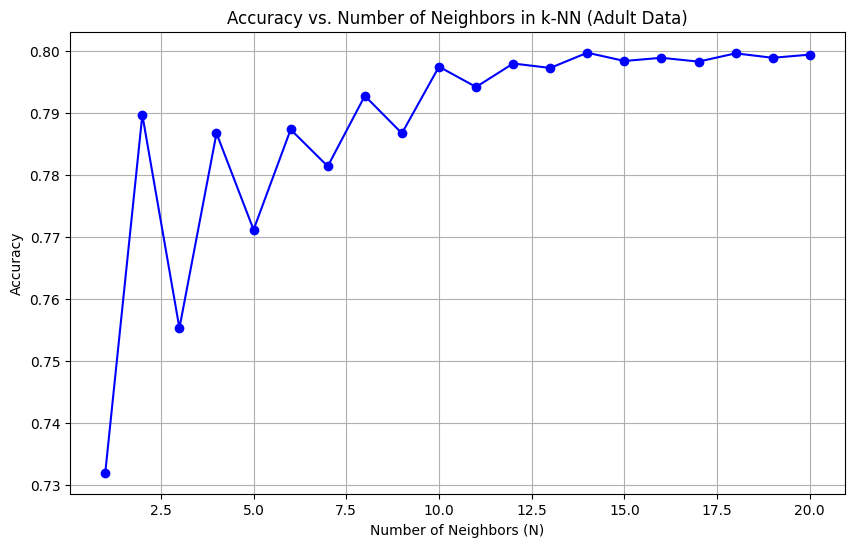

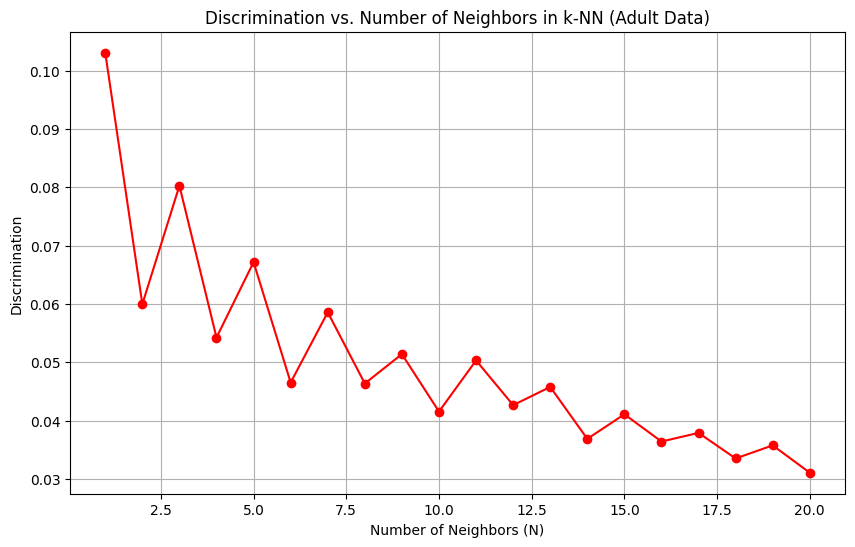

In [ ]:
x_label = "Number of Neighbors (N)"
y_label = "Accuracy"
graph_title = "Accuracy vs. Number of Neighbors in k-NN (Adult Data)"
plot_single_knn_results(x_label, y_label, graph_title, n_neighbors_range, accuracy_scores)

x_label = "Number of Neighbors (N)"
y_label = "Discrimination"
graph_title = "Discrimination vs. Number of Neighbors in k-NN (Adult Data)"
plot_single_knn_results(x_label, y_label, graph_title, n_neighbors_range, discrimination_scores, color='r')

### base knn on german dataset

In [ ]:
# Call the evaluation function
accuracy_scores, discrimination_scores = evaluate_knn_with_discrimination(
    X_train_ger_np, X_test_ger_np, y_train_ger_np, y_test_ger_np, sensitive_train_ger_np, sensitive_test_ger_np, n_neighbors_range
)
test_results["German"]["K-Nearest Neighbors"] = {"accuracy": accuracy_scores, "discrimination": discrimination_scores}

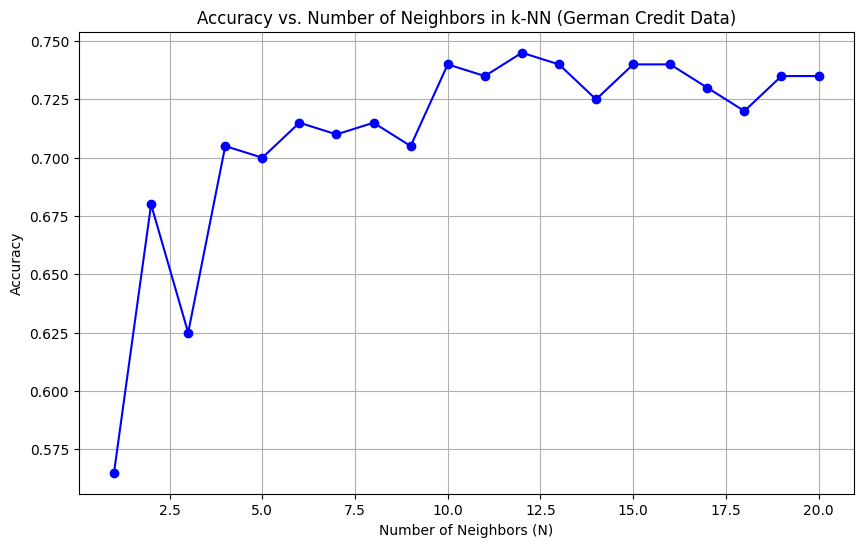

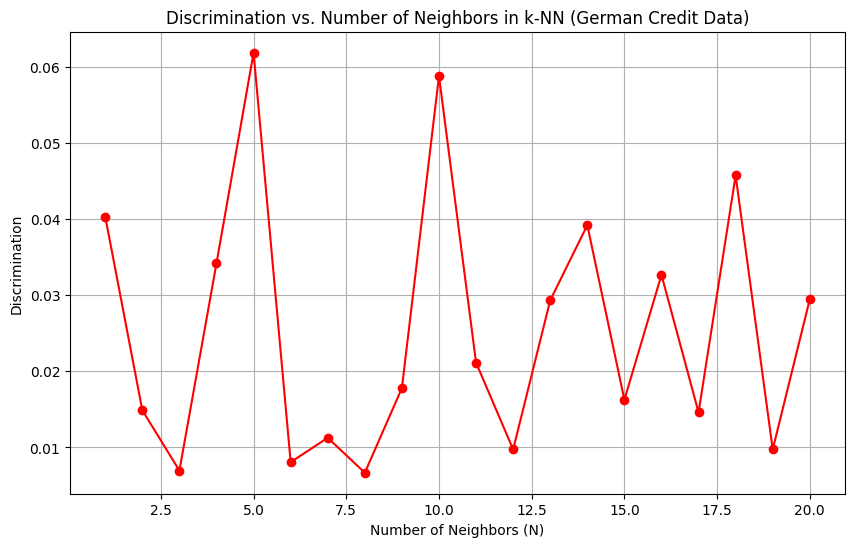

In [ ]:
# Plot the accuracy on a separate graph
plot_single_knn_results(
    "Number of Neighbors (N)",
    "Accuracy",
    "Accuracy vs. Number of Neighbors in k-NN (German Credit Data)",
    n_neighbors_range,
    accuracy_scores
)

plot_single_knn_results(
    "Number of Neighbors (N)",
    "Discrimination",
    "Discrimination vs. Number of Neighbors in k-NN (German Credit Data)",
    n_neighbors_range,
    discrimination_scores,
    color="r"
)

## auto-encoder (should we add a description of it?)


In [ ]:
class Autoencoder(nn.Module):
    def __init__(self, input_dim, encoding_dim, num_layers):
        super(Autoencoder, self).__init__()
        # Create encoder layers
        encoder_layers = []
        current_dim = input_dim
        for _ in range(num_layers):
            next_dim = max(encoding_dim, current_dim // 2)
            encoder_layers.append(nn.Linear(current_dim, next_dim))
            encoder_layers.append(nn.ReLU())
            current_dim = next_dim

        encoder_layers.append(nn.Linear(current_dim, encoding_dim))  # Final encoding layer
        self.encoder = nn.Sequential(*encoder_layers)

        # Create decoder layers
        decoder_layers = []
        current_dim = encoding_dim
        for _ in range(num_layers):
            next_dim = min(input_dim, current_dim * 2)
            decoder_layers.append(nn.Linear(current_dim, next_dim))
            decoder_layers.append(nn.ReLU())
            current_dim = next_dim

        decoder_layers.append(nn.Linear(current_dim, input_dim))  # Final decoding layer
        decoder_layers.append(nn.Sigmoid())
        self.decoder = nn.Sequential(*decoder_layers)

    def forward(self, x):
        encoded = self.encoder(x)
        decoded = self.decoder(encoded)
        return encoded, decoded


### auto-encoder on adult dataset

In [ ]:
input_dim = X_train_adult_np.shape[1]
encoding_dim = 16
num_layers = 3

autoencoder = Autoencoder(input_dim, encoding_dim, num_layers)

criterion = nn.MSELoss()
# criterion = nn.BCELoss() # bad don't use this one
# criterion = nn.CrossEntropyLoss()

optimizer = optim.Adam(autoencoder.parameters(), lr=1e-4)

train_dataset = TensorDataset(X_train_adult_tensor, X_train_adult_tensor)  #
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)

In [ ]:

num_epochs = 100
# num_epochs = 20 # set to 20 just for testing to make it run fast
# should we look into teh loss? it's like 2_438_941_952 ~= 2e9
for epoch in range(num_epochs):
    for data in train_loader:
        inputs, _ = data
        optimizer.zero_grad()
        _, outputs = autoencoder(inputs)
        loss = criterion(outputs, inputs)
        loss.backward()
        optimizer.step()

    if (epoch + 1) % 10 == 0:
        print(f'Epoch [{epoch + 1}/{num_epochs}], Loss: {loss.item():.4f}')


Epoch [10/100], Loss: 2963116032.0000
Epoch [20/100], Loss: 3779922176.0000


In [ ]:
with torch.no_grad():
    X_train_encoded = autoencoder.encoder(X_train_adult_tensor)
    X_test_encoded = autoencoder.encoder(X_test_adult_tensor)

# Convert the encoded data to numpy arrays for k-NN
X_train_encoded_adult = X_train_encoded.numpy()
X_test_encoded_adult = X_test_encoded.numpy()

In [ ]:
accuracy_scores, discrimination_scores = evaluate_knn_with_discrimination(
    X_train_encoded_adult, X_test_encoded_adult, y_train_adult_np, y_test_adult_np, sensitive_train_adult_np, sensitive_test_adult_np, n_neighbors_range
)
test_results["Adult"]["Auto-Encoder"] = {"accuracy": accuracy_scores, "discrimination": discrimination_scores}

NameError: name 'X_train_encoded_adult' is not defined

In [ ]:
plot_single_knn_results(
    "Number of Neighbors (N)",
    "Accuracy",
    "Accuracy vs. Number of Neighbors in k-NN (Adult ML Encoded Data)",
    n_neighbors_range,
    accuracy_scores
)

plot_single_knn_results(
    "Number of Neighbors (N)",
    "Discrimination",
    "Discrimination vs. Number of Neighbors in k-NN (Adult ML Encoded Data)",
    n_neighbors_range,
    discrimination_scores,
    color='r'
)

## Trials

In [ ]:

num_trials = 5

for trial in range(num_trials):
    input_dim = X_train_adult_np.shape[1]
    encoding_dim = 16
    num_layers = 3

    autoencoder = Autoencoder(input_dim, encoding_dim, num_layers)

    criterion = nn.MSELoss()
    # criterion = nn.BCELoss() # bad don't use this one
    # criterion = nn.CrossEntropyLoss()

    optimizer = optim.Adam(autoencoder.parameters(), lr=1e-4)

    train_dataset = TensorDataset(X_train_adult_tensor, X_train_adult_tensor)  #
    train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)


    num_epochs = 10
    # num_epochs = 20 # set to 20 just for testing to make it run fast
    # should we look into teh loss? it's like 2_438_941_952 ~= 2e9
    for epoch in range(num_epochs):
        for data in train_loader:
            inputs, _ = data
            optimizer.zero_grad()
            _, outputs = autoencoder(inputs)
            loss = criterion(outputs, inputs)
            loss.backward()
            optimizer.step()

        if (epoch + 1) % 10 == 0:
            print(f'Epoch [{epoch + 1}/{num_epochs}], Loss: {loss.item():.4f}')
    with torch.no_grad():
        X_train_encoded = autoencoder.encoder(X_train_adult_tensor)
        X_test_encoded = autoencoder.encoder(X_test_adult_tensor)

    # Convert the encoded data to numpy arrays for k-NN
    X_train_encoded_adult = X_train_encoded.numpy()
    X_test_encoded_adult = X_test_encoded.numpy()

    accuracy_scores, discrimination_scores = evaluate_knn_with_discrimination(
        X_train_encoded_adult, X_test_encoded_adult, y_train_adult_np, y_test_adult_np, sensitive_train_adult_np, sensitive_test_adult_np, n_neighbors_range
    )
    trial_results["Adult"]["Auto-Encoder"][f'trial {trial}'] = {"accuracy": accuracy_scores, "discrimination": discrimination_scores}



Epoch [10/10], Loss: 2963116032.0000
Epoch [10/10], Loss: 2838367744.0000
Epoch [10/10], Loss: 3546856704.0000
Epoch [10/10], Loss: 3282775808.0000
Epoch [10/10], Loss: 2793619200.0000


In [ ]:
import numpy as np
import matplotlib.pyplot as plt

autoencoder_results = trial_results["Adult"]["Auto-Encoder"]
num_trials = len(autoencoder_results)

accuracy_scores_trials = []
discrimination_scores_trials = []

for trial_key in autoencoder_results.keys():
    accuracy_scores_trials.append(autoencoder_results[trial_key]["accuracy"])
    discrimination_scores_trials.append(autoencoder_results[trial_key]["discrimination"])

accuracy_scores_trials = np.array(accuracy_scores_trials)
discrimination_scores_trials = np.array(discrimination_scores_trials)

mean_accuracy = np.mean(accuracy_scores_trials, axis=0)
std_accuracy = np.std(accuracy_scores_trials, axis=0)

mean_discrimination = np.mean(discrimination_scores_trials, axis=0)
std_discrimination = np.std(discrimination_scores_trials, axis=0)


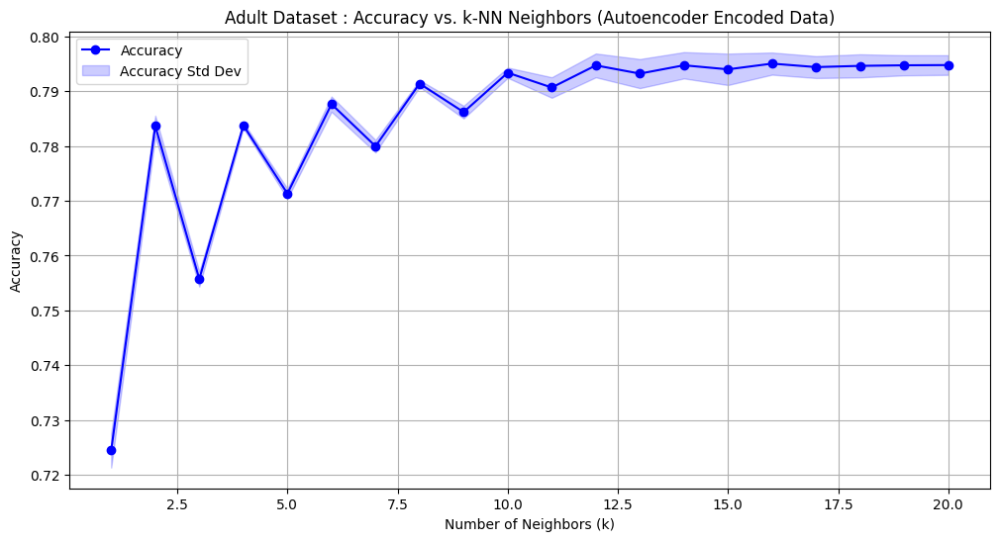

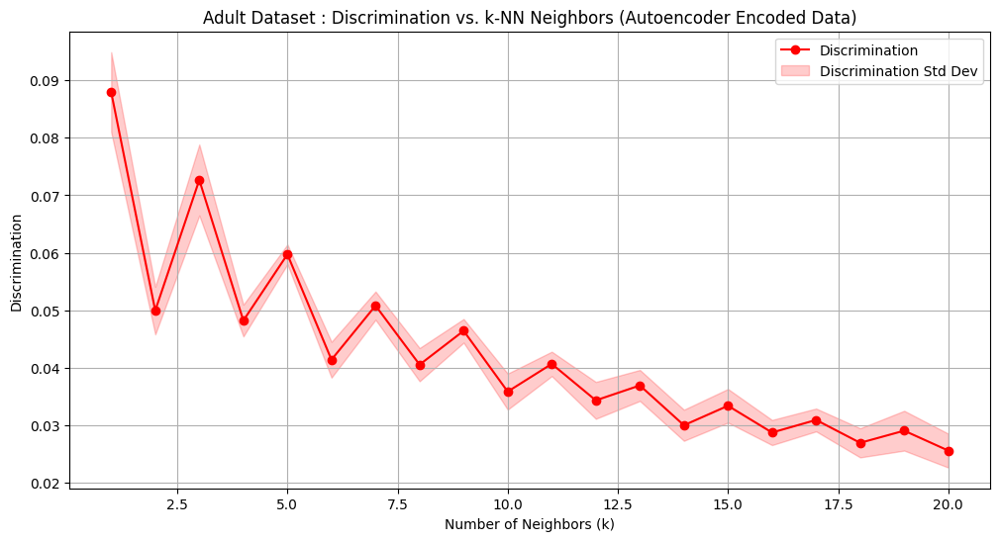

In [ ]:

# n_neighbors_range = range(1, len(mean_accuracy) + 1)

# # Plot accuracy
# plt.figure(figsize=(12, 6))
# plt.errorbar(n_neighbors_range, mean_accuracy, yerr=std_accuracy, label="Accuracy", fmt='-o', capsize=5)
# plt.title("Accuracy vs. k-NN Neighbors (Autoencoder Encoded Data)")
# plt.xlabel("Number of Neighbors (k)")
# plt.ylabel("Accuracy")
# plt.legend()
# plt.grid(True)
# plt.show()

# # Plot discrimination
# plt.figure(figsize=(12, 6))
# plt.errorbar(n_neighbors_range, mean_discrimination, yerr=std_discrimination, label="Discrimination", fmt='-o', capsize=5, color="red")
# plt.title("Discrimination vs. k-NN Neighbors (Autoencoder Encoded Data)")
# plt.xlabel("Number of Neighbors (k)")
# plt.ylabel("Discrimination")
# plt.legend()
# plt.grid(True)
# plt.show()


# Define x-axis (assuming n_neighbors_range is known)
n_neighbors_range = range(1, len(mean_accuracy) + 1)  # Replace with your actual range if needed

# Plot accuracy with shaded region
plt.figure(figsize=(12, 6))
plt.plot(n_neighbors_range, mean_accuracy, label="Accuracy", color="blue", marker='o', linestyle='-')
plt.fill_between(
    n_neighbors_range,
    mean_accuracy - std_accuracy,
    mean_accuracy + std_accuracy,
    color="blue",
    alpha=0.2,
    label="Accuracy Std Dev"
)
plt.title("Adult Dataset : Accuracy vs. k-NN Neighbors (Autoencoder Encoded Data)")
plt.xlabel("Number of Neighbors (k)")
plt.ylabel("Accuracy")
plt.legend()
plt.grid(True)
plt.show()

# Plot discrimination with shaded region
plt.figure(figsize=(12, 6))
plt.plot(n_neighbors_range, mean_discrimination, label="Discrimination", color="red", marker='o', linestyle='-')
plt.fill_between(
    n_neighbors_range,
    mean_discrimination - std_discrimination,
    mean_discrimination + std_discrimination,
    color="red",
    alpha=0.2,
    label="Discrimination Std Dev"
)
plt.title("Adult Dataset : Discrimination vs. k-NN Neighbors (Autoencoder Encoded Data)")
plt.xlabel("Number of Neighbors (k)")
plt.ylabel("Discrimination")
plt.legend()
plt.grid(True)
plt.show()

### auto-encoder on german dataset


In [ ]:
input_dim = X_train_ger_np.shape[1]
encoding_dim = 16
num_layers = 3

In [ ]:
autoencoder = Autoencoder(input_dim, encoding_dim, num_layers)

criterion = nn.MSELoss()
optimizer = optim.Adam(autoencoder.parameters(), lr=1e-4)

train_dataset = TensorDataset(X_train_ger_tensor, X_train_ger_tensor)
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)

In [ ]:
num_epochs = 100
# num_epochs = 20 # set to 20 just for testing to make it run fast
for epoch in range(num_epochs):
    for data in train_loader:
        inputs, _ = data
        optimizer.zero_grad()
        _, outputs = autoencoder(inputs)
        loss = criterion(outputs, inputs)
        loss.backward()
        optimizer.step()

    if (epoch + 1) % 10 == 0:
        print(f'Epoch [{epoch + 1}/{num_epochs}], Loss: {loss.item():.4f}')

Epoch [10/100], Loss: 747981.5625
Epoch [20/100], Loss: 975639.8750
Epoch [30/100], Loss: 691894.1875
Epoch [40/100], Loss: 1264767.8750
Epoch [50/100], Loss: 548304.8125
Epoch [60/100], Loss: 643561.5625
Epoch [70/100], Loss: 1873628.7500
Epoch [80/100], Loss: 1668267.0000
Epoch [90/100], Loss: 945220.6250
Epoch [100/100], Loss: 1132740.1250


In [ ]:
with torch.no_grad():
    X_train_encoded = autoencoder.encoder(X_train_ger_tensor)
    X_test_encoded = autoencoder.encoder(X_test_ger_tensor)

# Convert the encoded data to numpy arrays for k-NN
X_train_encoded_german = X_train_encoded.numpy()
X_test_encoded_german = X_test_encoded.numpy()

In [ ]:
accuracy_scores, discrimination_scores = evaluate_knn_with_discrimination(
    X_train_encoded_german, X_test_encoded_german, y_train_ger_np, y_test_ger_np, sensitive_train_ger_np, sensitive_test_ger_np, n_neighbors_range
)
test_results["German"]["Auto-Encoder"] = {"accuracy": accuracy_scores, "discrimination": discrimination_scores}

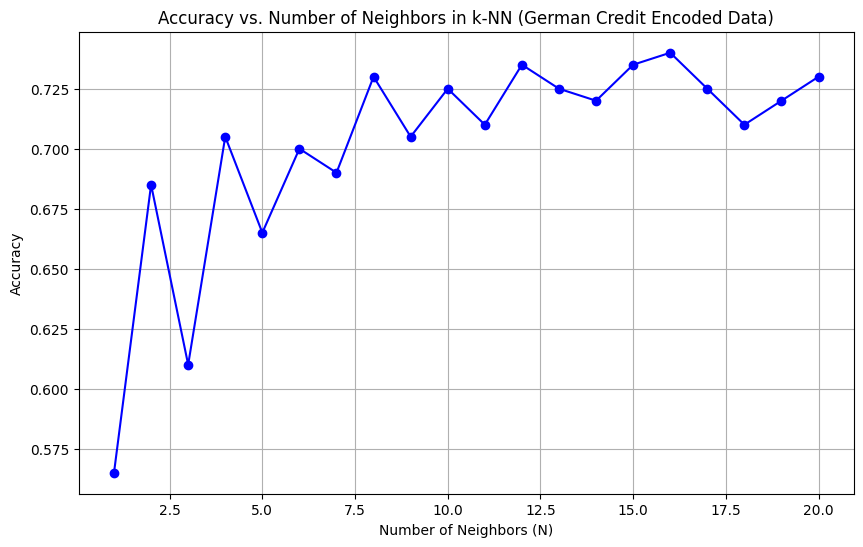

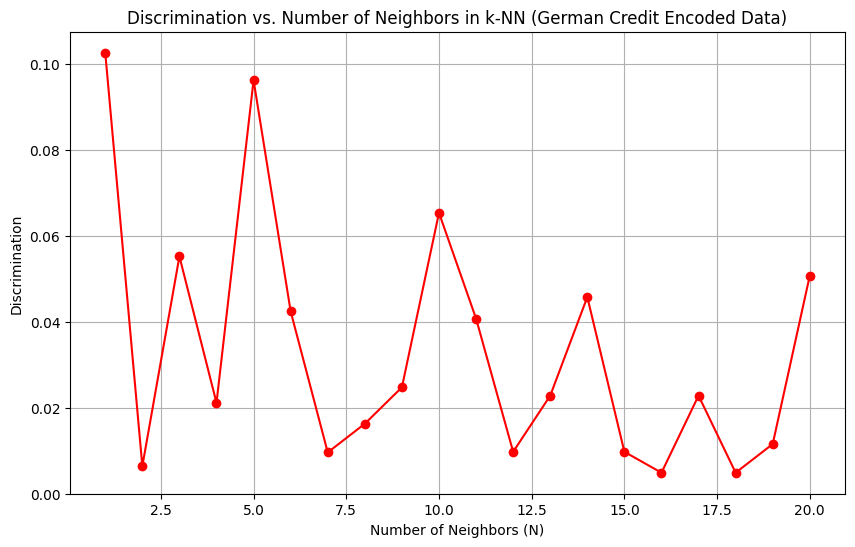

In [ ]:
plot_single_knn_results(
    "Number of Neighbors (N)",
    "Accuracy",
    "Accuracy vs. Number of Neighbors in k-NN (German Credit Encoded Data)",
    n_neighbors_range,
    accuracy_scores
)

plot_single_knn_results(
    "Number of Neighbors (N)",
    "Discrimination",
    "Discrimination vs. Number of Neighbors in k-NN (German Credit Encoded Data)",
    n_neighbors_range,
    discrimination_scores,
    color='r'
)

## Trials

In [ ]:

num_trials = 5

for trial in range(num_trials):
    input_dim = X_train_ger_np.shape[1]
    encoding_dim = 16
    num_layers = 3

    autoencoder = Autoencoder(input_dim, encoding_dim, num_layers)

    criterion = nn.MSELoss()
    optimizer = optim.Adam(autoencoder.parameters(), lr=1e-4)

    train_dataset = TensorDataset(X_train_ger_tensor, X_train_ger_tensor)
    train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)

    num_epochs = 100
    # num_epochs = 20 # set to 20 just for testing to make it run fast
    for epoch in range(num_epochs):
        for data in train_loader:
            inputs, _ = data
            optimizer.zero_grad()
            _, outputs = autoencoder(inputs)
            loss = criterion(outputs, inputs)
            loss.backward()
            optimizer.step()

        if (epoch + 1) % 10 == 0:
            print(f'Epoch [{epoch + 1}/{num_epochs}], Loss: {loss.item():.4f}')

    with torch.no_grad():
        X_train_encoded = autoencoder.encoder(X_train_ger_tensor)
        X_test_encoded = autoencoder.encoder(X_test_ger_tensor)

    # Convert the encoded data to numpy arrays for k-NN
    X_train_encoded_german = X_train_encoded.numpy()
    X_test_encoded_german = X_test_encoded.numpy()
    accuracy_scores, discrimination_scores = evaluate_knn_with_discrimination(
        X_train_encoded_german, X_test_encoded_german, y_train_ger_np, y_test_ger_np, sensitive_train_ger_np, sensitive_test_ger_np, n_neighbors_range
    )
    trial_results["German"]["Auto-Encoder"][f'trial {trial}'] = {"accuracy": accuracy_scores, "discrimination": discrimination_scores}


Epoch [10/100], Loss: 1274872.5000
Epoch [20/100], Loss: 480167.1250
Epoch [30/100], Loss: 534328.6875
Epoch [40/100], Loss: 1030988.5000
Epoch [50/100], Loss: 1115010.1250
Epoch [60/100], Loss: 574369.8125
Epoch [70/100], Loss: 624285.5625
Epoch [80/100], Loss: 1441658.7500
Epoch [90/100], Loss: 1185147.7500
Epoch [100/100], Loss: 820903.6250
Epoch [10/100], Loss: 627780.6875
Epoch [20/100], Loss: 819494.9375
Epoch [30/100], Loss: 582420.4375
Epoch [40/100], Loss: 1087226.3750
Epoch [50/100], Loss: 532198.0000
Epoch [60/100], Loss: 829736.9375
Epoch [70/100], Loss: 815853.3125
Epoch [80/100], Loss: 1052728.6250
Epoch [90/100], Loss: 642959.1250
Epoch [100/100], Loss: 753384.6875
Epoch [10/100], Loss: 934950.3125
Epoch [20/100], Loss: 686761.3125
Epoch [30/100], Loss: 938663.7500
Epoch [40/100], Loss: 856297.3125
Epoch [50/100], Loss: 1109183.3750
Epoch [60/100], Loss: 1399710.0000
Epoch [70/100], Loss: 1254956.1250
Epoch [80/100], Loss: 890026.5000
Epoch [90/100], Loss: 792448.6250
Ep

In [ ]:
german_results = trial_results["German"]["Auto-Encoder"]
num_trials = len(german_results)

accuracy_scores_trials = []
discrimination_scores_trials = []

for trial_key in german_results.keys():
    accuracy_scores_trials.append(german_results[trial_key]["accuracy"])
    discrimination_scores_trials.append(german_results[trial_key]["discrimination"])

accuracy_scores_trials = np.array(accuracy_scores_trials)
discrimination_scores_trials = np.array(discrimination_scores_trials)

mean_accuracy = np.mean(accuracy_scores_trials, axis=0)
std_accuracy = np.std(accuracy_scores_trials, axis=0)

mean_discrimination = np.mean(discrimination_scores_trials, axis=0)
std_discrimination = np.std(discrimination_scores_trials, axis=0)

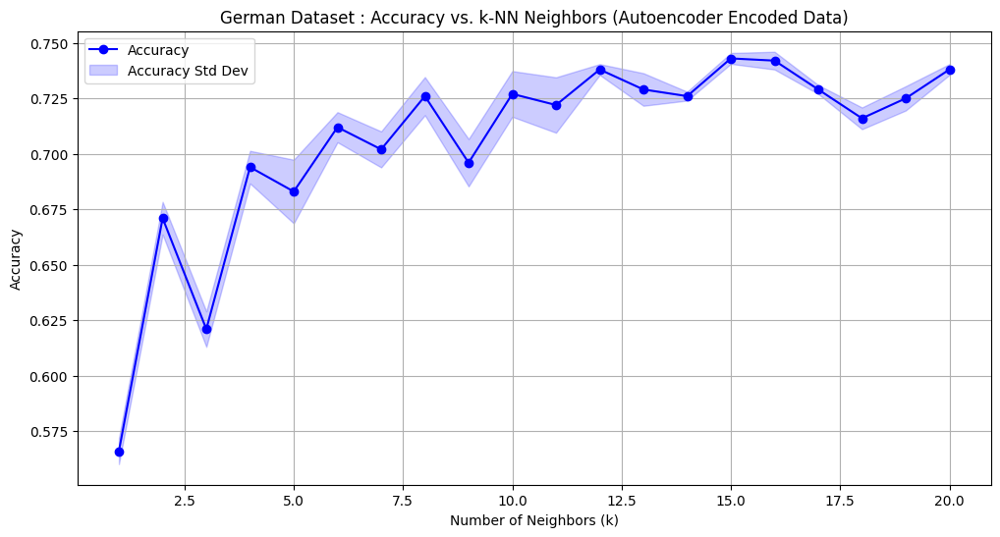

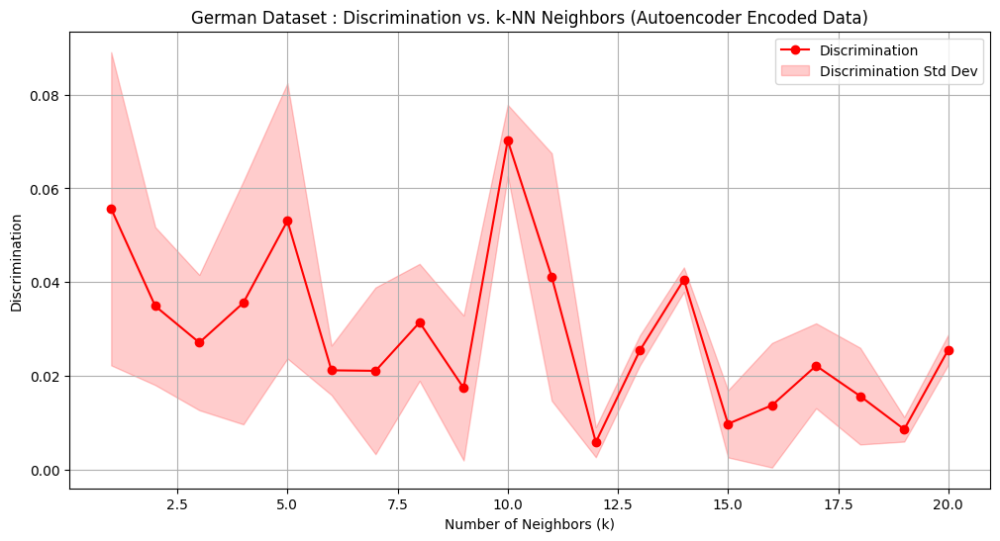

In [ ]:
# Define x-axis (assuming n_neighbors_range is known)
n_neighbors_range = range(1, len(mean_accuracy) + 1)  # Replace with your actual range if needed

# Plot accuracy with shaded region
plt.figure(figsize=(12, 6))
plt.plot(n_neighbors_range, mean_accuracy, label="Accuracy", color="blue", marker='o', linestyle='-')
plt.fill_between(
    n_neighbors_range,
    mean_accuracy - std_accuracy,
    mean_accuracy + std_accuracy,
    color="blue",
    alpha=0.2,
    label="Accuracy Std Dev"
)
plt.title("German Dataset : Accuracy vs. k-NN Neighbors (Autoencoder Encoded Data)")
plt.xlabel("Number of Neighbors (k)")
plt.ylabel("Accuracy")
plt.legend()
plt.grid(True)
plt.show()

# Plot discrimination with shaded region
plt.figure(figsize=(12, 6))
plt.plot(n_neighbors_range, mean_discrimination, label="Discrimination", color="red", marker='o', linestyle='-')
plt.fill_between(
    n_neighbors_range,
    mean_discrimination - std_discrimination,
    mean_discrimination + std_discrimination,
    color="red",
    alpha=0.2,
    label="Discrimination Std Dev"
)
plt.title("German Dataset : Discrimination vs. k-NN Neighbors (Autoencoder Encoded Data)")
plt.xlabel("Number of Neighbors (k)")
plt.ylabel("Discrimination")
plt.legend()
plt.grid(True)
plt.show()

## Fair representation encoder

Learning fair representations
https://proceedings.mlr.press/v28/zemel13

In [ ]:
class FairRepresentationModel():
  def __init__(self, params, data_sensitive, data_nonsensitive, y_sensitive, y_nonsensitive, k=10, A_x=1e-4, A_y=0.1, A_z=0.1):
    self.params = params
    self.data_sensitive = data_sensitive
    self.data_nonsensitive = data_nonsensitive
    self.y_sensitive = y_sensitive
    self.y_nonsensitive = y_nonsensitive
    self.k = k
    self.A_x = A_x
    self.A_y = A_y
    self.A_z = A_z
    self.iters = 0

  def distances(self, X, v, alpha):
    diff = X.unsqueeze(1) - v # (N, 1, P) -(k,P) = (N,k,P)
    weighted_diff = ( diff**2 ) * alpha # (N,1,P)*(P)
    dists = torch.sum(weighted_diff, dim=2)
    return dists

  def prob_z_eq_k_given_x(self, dists):
    # print(torch.softmax(-dists / 100, dim=1)[0])
    return torch.softmax(-dists / 100, dim=1)

  def m_k(self, m_n_k):
    return torch.mean(m_n_k, dim=0)

  def x_n_hat_and_l_x(self, X, m_n_k, v):
    x_n_hat = torch.matmul(m_n_k, v)
    l_x = torch.sum((X - x_n_hat) ** 2)
    return x_n_hat, l_x

  def y_hat_and_l_y(self, m_n_k, y, w):
    y_hat = torch.clamp( torch.matmul(m_n_k, w) , min=1e-6, max=1 - 1e-6)
    l_y = -torch.sum(y * torch.log(y_hat) + (1 - y) * torch.log(1 - y_hat))
    return y_hat, l_y

  def l_z_function(self, m_k_sense, m_k_nonsense):
    return torch.sum(torch.abs(m_k_sense - m_k_nonsense))

  def compute_loss(self, results=False):
    N_sense, P = self.data_sensitive.shape
    N_nonsense, _ = self.data_nonsensitive.shape
    alpha_plus = self.params[ : P]
    alpha_minus = self.params[P : 2*P]
    w = self.params[2*P : (2*P) + self.k]
    v = self.params[ 2*P + self.k : ].reshape(self.k, P)

    # print("0:sense, nosense", self.data_sensitive.unique().size(), self.data_nonsensitive.unique().size())

    dists_sense = self.distances(self.data_sensitive, v, alpha_plus)
    dists_nonsense = self.distances(self.data_nonsensitive, v, alpha_minus)

    # print("Distances shape:", dists_sense.shape)
    # print("Sample distances:", dists_sense[0])

    # print("Distances shape:", dists_nonsense.shape)
    # print("Sample distances:", dists_nonsense[0])
    # print("1:sense, nosense", dists_sense.unique().size(), dists_nonsense.unique().size())

    m_n_k_sense = self.prob_z_eq_k_given_x(dists_sense)
    m_n_k_nonsense = self.prob_z_eq_k_given_x(dists_nonsense)

    # print("2:sense, nosense", m_n_k_sense.unique().size(), m_n_k_nonsense.unique().size())

    m_k_sense = self.m_k(m_n_k_sense)
    m_k_nonsense = self.m_k(m_n_k_nonsense)

    # print("3:sense, nosense", m_k_sense.unique().size(), m_k_nonsense.unique().size())

    l_z = self.l_z_function(m_k_sense, m_k_nonsense)

    _, l_x_sense = self.x_n_hat_and_l_x(self.data_sensitive, m_n_k_sense, v)
    _, l_x_nonsense = self.x_n_hat_and_l_x(self.data_nonsensitive, m_n_k_nonsense, v)
    l_x = l_x_sense + l_x_nonsense

    y_hat_sense, l_y_sense = self.y_hat_and_l_y(m_n_k_sense, self.y_sensitive, w)
    y_hat_nonsense, l_y_nonsense = self.y_hat_and_l_y(m_n_k_nonsense, self.y_nonsensitive, w)
    l_y = torch.sum(l_y_sense) + torch.sum(l_y_nonsense)

    loss = self.A_x * l_x + self.A_y * l_y + self.A_z * l_z

    if results: # returns embeddings
      return m_n_k_sense, m_n_k_nonsense
      # return y_hat_sense, y_hat_nonsense
    else:
      return loss

  def embed_data(self, X, is_sensitive):
    P = X.shape[1]
    alpha = self.params[:P] if is_sensitive else self.params[P:2*P]
    v = self.params[2*P + self.k :].reshape(self.k, P)
    dists = self.distances(X, v, alpha)
    return self.prob_z_eq_k_given_x(dists)


In [ ]:
def normalize_features(data:torch.tensor) -> torch.Tensor:
  min_vals = data.min(dim=0, keepdim=True).values  # Minimum values for each column
  max_vals = data.max(dim=0, keepdim=True).values  # Maximum values for each column
  return (data - min_vals) / (max_vals - min_vals + 1e-9)  # Normalize to [0, 1]


### fair-rep on adultset

What the error is:
- all the embeddings become the same value, hence flat graphs

In [ ]:
k = 14 # k = number of prototypes
P = X_train_adult_np.shape[1] # P = number of features in each sample
initial_params = torch.randn((2 * P + k + k * P), requires_grad=True)

data_sense = normalize_features(X_train_adult_tensor[sensitive_train_adult_tensor == 1])
data_nonsense = normalize_features(X_train_adult_tensor[sensitive_train_adult_tensor == 0])
y_sense = Y_train_adult_tensor[sensitive_train_adult_tensor == 1]
y_nonsense = Y_train_adult_tensor[sensitive_train_adult_tensor == 0]
print("data sensitive:", data_sense[0], data_sense.shape ,data_sense.unique().size(), data_sense.isnan().any())
print("data nonsensitive:", data_nonsense[0], data_nonsense.shape , data_nonsense.unique().size(), data_nonsense.isnan().any())
print("y sensitive:", y_sense.unique())
print("y nonsensitive:", y_nonsense.unique())

fair_model = FairRepresentationModel(initial_params, data_sense, data_nonsense, y_sense, y_nonsense, k)

optimizer = optim.LBFGS([fair_model.params],tolerance_grad=1e-5, max_iter=5)

def closure():
  optimizer.zero_grad()
  loss = fair_model.compute_loss()
  loss.backward()
  # if fair_model.iters % 10 == 0:
  print(f'Iteration {fair_model.iters}: Loss = {loss.item()}')
  fair_model.iters += 1
  return loss
optimizer.step(closure)

# obtain fair embeddings
fair_rep_train_sensitive, fair_rep_train_nonsensitive = fair_model.compute_loss(results=True)
print(fair_rep_train_sensitive.shape, fair_rep_train_sensitive.unique().size())
print(fair_rep_train_nonsensitive.shape, fair_rep_train_nonsensitive.unique().size())
print(X_train_adult_tensor.shape)

fair_embedded_train_adult_tensor = torch.zeros_like(X_train_adult_tensor)
fair_embedded_train_adult_tensor[sensitive_train_adult_tensor == 1] = fair_rep_train_sensitive
fair_embedded_train_adult_tensor[sensitive_train_adult_tensor == 0] = fair_rep_train_nonsensitive
fair_embedded_train_adult_np = fair_embedded_train_adult_tensor.detach().numpy()

fair_embedding_test_adult_tensor = torch.zeros_like(X_test_adult_tensor)
fair_embedding_test_adult_tensor[sensitive_test_adult_tensor==1] = fair_model.embed_data( normalize_features(X_test_adult_tensor[sensitive_test_adult_tensor==1]) , is_sensitive=True)
fair_embedding_test_adult_tensor[sensitive_test_adult_tensor==0] = fair_model.embed_data( normalize_features(X_test_adult_tensor[sensitive_test_adult_tensor==0]) , is_sensitive=False)
fair_embedding_test_adult_np = fair_embedding_test_adult_tensor.detach().numpy()

print(fair_embedding_test_adult_tensor.shape, fair_embedding_test_adult_tensor.unique().size(), fair_embedding_test_adult_tensor.isnan().any())
print(fair_embedded_train_adult_tensor.shape, fair_embedded_train_adult_tensor.unique().size(), fair_embedded_train_adult_tensor.isnan().any())

In [ ]:
accuracy_scores, discrimination_scores = evaluate_knn_with_discrimination(
    fair_embedded_train_adult_np, fair_embedding_test_adult_np, y_train_adult_np, y_test_adult_np, sensitive_train_adult_np, sensitive_test_adult_np, n_neighbors_range
)

test_results["Adult"]["Fair Representation Auto-Encoder"] = {"accuracy": accuracy_scores, "discrimination": discrimination_scores}

plot_single_knn_results(
    "Number of Neighbors (N)",
    "Accuracy",
    "Accuracy vs. Number of Neighbors in k-NN (Adult Fair Representation Encoded Data)",
    n_neighbors_range,
    accuracy_scores
)

plot_single_knn_results(
    "Number of Neighbors (N)",
    "Discrimination",
    "Discrimination vs. Number of Neighbors in k-NN (Adult Fair Representation Encoded Data)",
    n_neighbors_range,
    discrimination_scores,
    color='r'
)

KeyboardInterrupt: 

## Trials

In [ ]:

num_trials = 5

for trial in range(num_trials):
    torch.manual_seed(trial)
    np.random.seed(trial)
    k = 14 # k = number of prototypes
    P = X_train_adult_np.shape[1] # P = number of features in each sample
    initial_params = torch.randn((2 * P + k + k * P), requires_grad=True)


    data_sense = normalize_features(X_train_adult_tensor[sensitive_train_adult_tensor == 1])
    data_nonsense = normalize_features(X_train_adult_tensor[sensitive_train_adult_tensor == 0])
    y_sense = Y_train_adult_tensor[sensitive_train_adult_tensor == 1]
    y_nonsense = Y_train_adult_tensor[sensitive_train_adult_tensor == 0]
    # print("data sensitive:", data_sense[0], data_sense.shape ,data_sense.unique().size(), data_sense.isnan().any())
    # print("data nonsensitive:", data_nonsense[0], data_nonsense.shape , data_nonsense.unique().size(), data_nonsense.isnan().any())
    # print("y sensitive:", y_sense.unique())
    # print("y nonsensitive:", y_nonsense.unique())

    fair_model = FairRepresentationModel(initial_params, data_sense, data_nonsense, y_sense, y_nonsense, k)

    optimizer = optim.LBFGS([fair_model.params],tolerance_grad=1e-5, max_iter=10)

    def closure():
        optimizer.zero_grad()
        loss = fair_model.compute_loss()
        loss.backward()
        # if fair_model.iters % 10 == 0:
        print(f'Iteration {fair_model.iters}: Loss = {loss.item()}')
        fair_model.iters += 1
        return loss
    optimizer.step(closure)

    # obtain fair embeddings
    fair_rep_train_sensitive, fair_rep_train_nonsensitive = fair_model.compute_loss(results=True)
    # print(fair_rep_train_sensitive.shape, fair_rep_train_sensitive.unique().size())
    # print(fair_rep_train_nonsensitive.shape, fair_rep_train_nonsensitive.unique().size())
    # print(X_train_adult_tensor.shape)

    fair_embedded_train_adult_tensor = torch.zeros_like(X_train_adult_tensor)
    fair_embedded_train_adult_tensor[sensitive_train_adult_tensor == 1] = fair_rep_train_sensitive
    fair_embedded_train_adult_tensor[sensitive_train_adult_tensor == 0] = fair_rep_train_nonsensitive
    fair_embedded_train_adult_np = fair_embedded_train_adult_tensor.detach().numpy()

    fair_embedding_test_adult_tensor = torch.zeros_like(X_test_adult_tensor)
    fair_embedding_test_adult_tensor[sensitive_test_adult_tensor==1] = fair_model.embed_data( normalize_features(X_test_adult_tensor[sensitive_test_adult_tensor==1]) , is_sensitive=True)
    fair_embedding_test_adult_tensor[sensitive_test_adult_tensor==0] = fair_model.embed_data( normalize_features(X_test_adult_tensor[sensitive_test_adult_tensor==0]) , is_sensitive=False)
    fair_embedding_test_adult_np = fair_embedding_test_adult_tensor.detach().numpy()

    accuracy_scores, discrimination_scores = evaluate_knn_with_discrimination(
        fair_embedded_train_adult_np, fair_embedding_test_adult_np, y_train_adult_np, y_test_adult_np, sensitive_train_adult_np, sensitive_test_adult_np, n_neighbors_range
    )

    # print(fair_embedding_test_adult_tensor.shape, fair_embedding_test_adult_tensor.unique().size(), fair_embedding_test_adult_tensor.isnan().any())
    # print(fair_embedded_train_adult_tensor.shape, fair_embedded_train_adult_tensor.unique().size(), fair_embedded_train_adult_tensor.isnan().any())
    trial_results["Adult"]["Fair Representation Encoder"][f'trial {trial}'] = {"accuracy": accuracy_scores, "discrimination": discrimination_scores}


Iteration 0: Loss = 50036904.0
Iteration 1: Loss = 49115924.0
Iteration 2: Loss = 49105264.0
Iteration 3: Loss = 49085812.0
Iteration 4: Loss = 49004584.0
Iteration 5: Loss = 48769524.0
Iteration 6: Loss = 71352888.0
Iteration 7: Loss = 48595684.0
Iteration 8: Loss = 48435572.0
Iteration 9: Loss = 678977472.0
Iteration 0: Loss = 309117152.0
Iteration 1: Loss = 67903104.0
Iteration 2: Loss = 63331940.0
Iteration 3: Loss = 55885224.0
Iteration 4: Loss = 51815720.0
Iteration 5: Loss = 49576720.0
Iteration 6: Loss = 48973540.0
Iteration 7: Loss = 48902100.0
Iteration 8: Loss = 48891316.0
Iteration 9: Loss = 48863080.0
Iteration 0: Loss = 50097984.0
Iteration 1: Loss = 49384244.0
Iteration 2: Loss = 49374320.0
Iteration 3: Loss = 49362648.0
Iteration 4: Loss = 49333364.0
Iteration 5: Loss = 49261716.0
Iteration 6: Loss = 49110492.0
Iteration 7: Loss = 48843996.0
Iteration 8: Loss = 48396848.0
Iteration 9: Loss = 47854120.0
Iteration 0: Loss = 50887404.0
Iteration 1: Loss = 49206776.0
Iterat

In [ ]:

fair_results = trial_results["Adult"]["Fair Representation Encoder"]
num_trials = len(fair_results)

accuracy_scores_trials = []
discrimination_scores_trials = []

for trial_key in fair_results.keys():
    accuracy_scores_trials.append(fair_results[trial_key]["accuracy"])
    discrimination_scores_trials.append(fair_results[trial_key]["discrimination"])

accuracy_scores_trials = np.array(accuracy_scores_trials)
discrimination_scores_trials = np.array(discrimination_scores_trials)

mean_accuracy = np.mean(accuracy_scores_trials, axis=0)
std_accuracy = np.std(accuracy_scores_trials, axis=0)

mean_discrimination = np.mean(discrimination_scores_trials, axis=0)
std_discrimination = np.std(discrimination_scores_trials, axis=0)


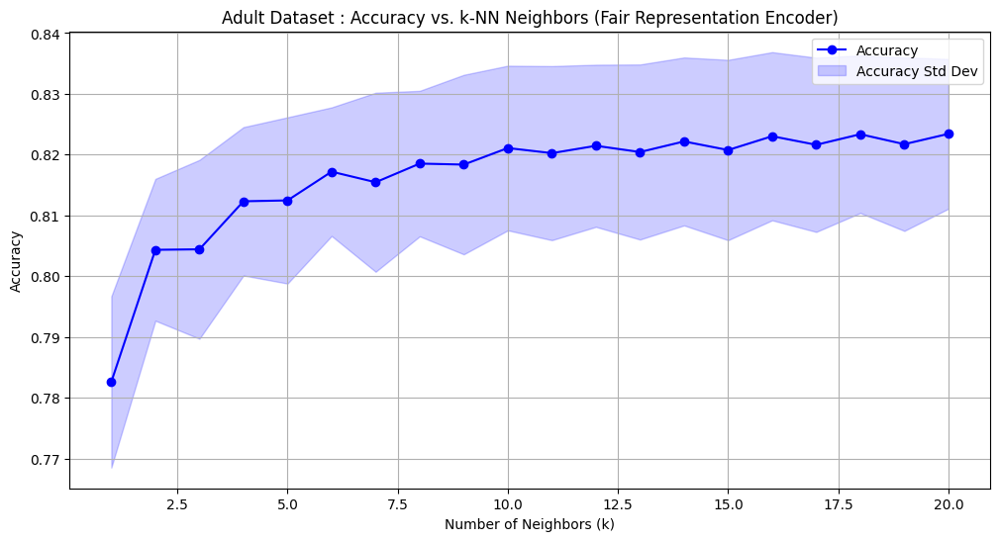

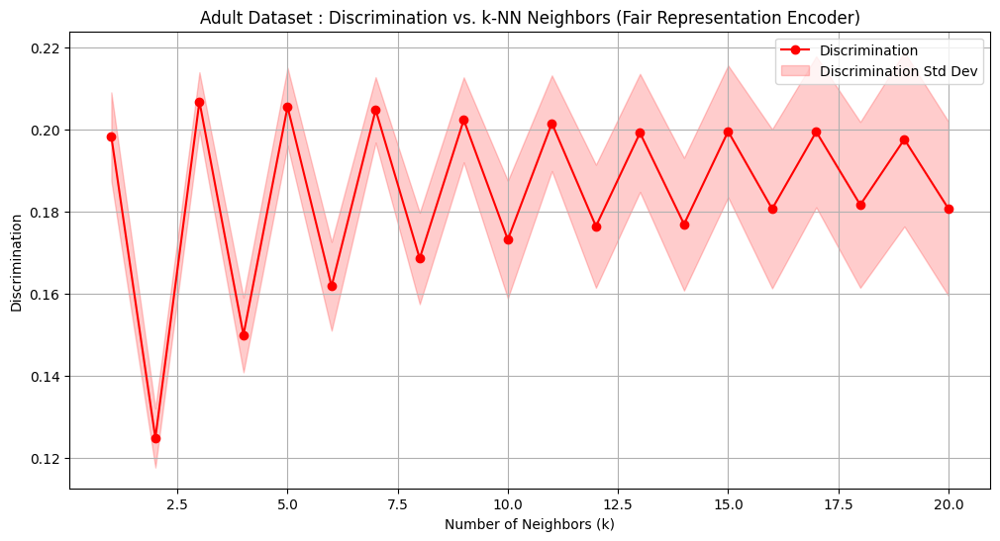

In [ ]:
# Define x-axis (assuming n_neighbors_range is known)
n_neighbors_range = range(1, len(mean_accuracy) + 1)  # Replace with your actual range if needed

# Plot accuracy with shaded region
plt.figure(figsize=(12, 6))
plt.plot(n_neighbors_range, mean_accuracy, label="Accuracy", color="blue", marker='o', linestyle='-')
plt.fill_between(
    n_neighbors_range,
    mean_accuracy - std_accuracy,
    mean_accuracy + std_accuracy,
    color="blue",
    alpha=0.2,
    label="Accuracy Std Dev"
)
plt.title("Adult Dataset : Accuracy vs. k-NN Neighbors (Fair Representation Encoder)")
plt.xlabel("Number of Neighbors (k)")
plt.ylabel("Accuracy")
plt.legend()
plt.grid(True)
plt.show()

# Plot discrimination with shaded region
plt.figure(figsize=(12, 6))
plt.plot(n_neighbors_range, mean_discrimination, label="Discrimination", color="red", marker='o', linestyle='-')
plt.fill_between(
    n_neighbors_range,
    mean_discrimination - std_discrimination,
    mean_discrimination + std_discrimination,
    color="red",
    alpha=0.2,
    label="Discrimination Std Dev"
)
plt.title("Adult Dataset : Discrimination vs. k-NN Neighbors (Fair Representation Encoder)")
plt.xlabel("Number of Neighbors (k)")
plt.ylabel("Discrimination")
plt.legend()
plt.grid(True)
plt.show()

### fair-rep on german dataset

In [ ]:
k = 20 # k = number of prototypes (20 is arbitrary)
P = X_train_ger_np.shape[1] # P = number of features in each sample
initial_params = torch.randn((2 * P + k + k * P), requires_grad=True)

data_sense = normalize_features(X_train_ger_tensor[sensitive_train_ger_tensor == 1])
data_nonsense = normalize_features(X_train_ger_tensor[sensitive_train_ger_tensor == 0])
y_sense = Y_train_ger_tensor[sensitive_train_ger_tensor == 1]
y_nonsense = Y_train_ger_tensor[sensitive_train_ger_tensor == 0]

fair_model = FairRepresentationModel(initial_params, data_sense, data_nonsense, y_sense, y_nonsense, k)

optimizer = optim.LBFGS([fair_model.params],tolerance_grad=1e-5, max_iter=1000)

def closure():
  optimizer.zero_grad()
  loss = fair_model.compute_loss()
  loss.backward()
  ##
#   print("Gradients:", fair_model.params.grad)
  ##
  if fair_model.iters % 10 == 0:
    print(f'Iteration {fair_model.iters}: Loss = {loss.item()}')
  fair_model.iters += 1
  return loss
##
# old_params = fair_model.params.clone()
##
optimizer.step(closure)

##
# print("Parameter change:", torch.sum(torch.abs(fair_model.params - old_params)))
##

# obtain fair embeddings
fair_rep_train_sensitive, fair_rep_train_nonsensitive = fair_model.compute_loss(results=True)

fair_embedded_train_ger_tensor = torch.zeros_like(X_train_ger_tensor)
fair_embedded_train_ger_tensor[sensitive_train_ger_tensor == 1] = fair_rep_train_sensitive
fair_embedded_train_ger_tensor[sensitive_train_ger_tensor == 0] = fair_rep_train_nonsensitive
fair_embedded_train_ger_np = fair_embedded_train_ger_tensor.detach().numpy()

fair_embedding_test_ger_tensor = torch.zeros_like(X_test_ger_tensor)
fair_embedding_test_ger_tensor[sensitive_test_ger_tensor==1] = fair_model.embed_data( normalize_features(X_test_ger_tensor[sensitive_test_ger_tensor==1]), is_sensitive=True)
fair_embedding_test_ger_tensor[sensitive_test_ger_tensor==0] = fair_model.embed_data( normalize_features(X_test_ger_tensor[sensitive_test_ger_tensor==0]), is_sensitive=False)
fair_embedding_test_ger_np = fair_embedding_test_ger_tensor.detach().numpy()

Iteration 0: Loss = 40465.56640625
Iteration 10: Loss = 26796.330078125
Iteration 20: Loss = 26635.125
Iteration 30: Loss = 26628.4765625
Iteration 40: Loss = 26628.28125


In [ ]:
accuracy_scores, discrimination_scores = evaluate_knn_with_discrimination(
    fair_embedded_train_ger_np, fair_embedding_test_ger_np, y_train_ger_np, y_test_ger_np, sensitive_train_ger_np, sensitive_test_ger_np, n_neighbors_range
)

test_results["German"]["Fair Representation Auto-Encoder"] = {"accuracy": accuracy_scores, "discrimination": discrimination_scores}

plot_single_knn_results(
    "Number of Neighbors (N)",
    "Accuracy",
    "Accuracy vs. Number of Neighbors in k-NN (German Credit Fair Representation Encoded Data)",
    n_neighbors_range,
    accuracy_scores
)

plot_single_knn_results(
    "Number of Neighbors (N)",
    "Discrimination",
    "Discrimination vs. Number of Neighbors in k-NN (German Credit Fair Representation Encoded Data)",
    n_neighbors_range,
    discrimination_scores,
    color='r'
)

## Trials

In [ ]:

num_trials = 5

for trial in range(num_trials):
    k = 20 # k = number of prototypes (20 is arbitrary)
    P = X_train_ger_np.shape[1] # P = number of features in each sample
    initial_params = torch.randn((2 * P + k + k * P), requires_grad=True)

    data_sense = normalize_features(X_train_ger_tensor[sensitive_train_ger_tensor == 1])
    data_nonsense = normalize_features(X_train_ger_tensor[sensitive_train_ger_tensor == 0])
    y_sense = Y_train_ger_tensor[sensitive_train_ger_tensor == 1]
    y_nonsense = Y_train_ger_tensor[sensitive_train_ger_tensor == 0]

    fair_model = FairRepresentationModel(initial_params, data_sense, data_nonsense, y_sense, y_nonsense, k)

    optimizer = optim.LBFGS([fair_model.params],tolerance_grad=1e-5, max_iter=1000)

    def closure():
        optimizer.zero_grad()
        loss = fair_model.compute_loss()
        loss.backward()
        ##
        #   print("Gradients:", fair_model.params.grad)
        ##
        if fair_model.iters % 10 == 0:
            print(f'Iteration {fair_model.iters}: Loss = {loss.item()}')
        fair_model.iters += 1
        return loss
    ##
    # old_params = fair_model.params.clone()
    ##
    optimizer.step(closure)

    ##
    # print("Parameter change:", torch.sum(torch.abs(fair_model.params - old_params)))
    ##

    # obtain fair embeddings
    fair_rep_train_sensitive, fair_rep_train_nonsensitive = fair_model.compute_loss(results=True)

    fair_embedded_train_ger_tensor = torch.zeros_like(X_train_ger_tensor)
    fair_embedded_train_ger_tensor[sensitive_train_ger_tensor == 1] = fair_rep_train_sensitive
    fair_embedded_train_ger_tensor[sensitive_train_ger_tensor == 0] = fair_rep_train_nonsensitive
    fair_embedded_train_ger_np = fair_embedded_train_ger_tensor.detach().numpy()

    fair_embedding_test_ger_tensor = torch.zeros_like(X_test_ger_tensor)
    fair_embedding_test_ger_tensor[sensitive_test_ger_tensor==1] = fair_model.embed_data( normalize_features(X_test_ger_tensor[sensitive_test_ger_tensor==1]), is_sensitive=True)
    fair_embedding_test_ger_tensor[sensitive_test_ger_tensor==0] = fair_model.embed_data( normalize_features(X_test_ger_tensor[sensitive_test_ger_tensor==0]), is_sensitive=False)
    fair_embedding_test_ger_np = fair_embedding_test_ger_tensor.detach().numpy()
    accuracy_scores, discrimination_scores = evaluate_knn_with_discrimination(
        fair_embedded_train_ger_np, fair_embedding_test_ger_np, y_train_ger_np, y_test_ger_np, sensitive_train_ger_np, sensitive_test_ger_np, n_neighbors_range
    )

    trial_results["German"]["Fair Representation Encoder"][f'trial {trial}'] = {"accuracy": accuracy_scores, "discrimination": discrimination_scores}

Iteration 0: Loss = 40465.56640625
Iteration 10: Loss = 26796.330078125
Iteration 20: Loss = 26635.125
Iteration 30: Loss = 26628.4765625
Iteration 40: Loss = 26628.28125
Iteration 0: Loss = 174871.65625
Iteration 0: Loss = 32122.322265625
Iteration 10: Loss = 26709.98046875
Iteration 20: Loss = 26633.3984375
Iteration 30: Loss = 26629.2578125
Iteration 40: Loss = 26628.28515625
Iteration 0: Loss = 174871.796875
Iteration 0: Loss = 29301.59375
Iteration 10: Loss = 26679.130859375
Iteration 20: Loss = 26631.337890625
Iteration 30: Loss = 26628.8828125


In [ ]:
german_results = trial_results["German"]["Fair Representation Encoder"]
num_trials = len(german_results)

accuracy_scores_trials = []
discrimination_scores_trials = []

for trial_key in german_results.keys():
    accuracy_scores_trials.append(german_results[trial_key]["accuracy"])
    discrimination_scores_trials.append(german_results[trial_key]["discrimination"])

accuracy_scores_trials = np.array(accuracy_scores_trials)
discrimination_scores_trials = np.array(discrimination_scores_trials)

mean_accuracy = np.mean(accuracy_scores_trials, axis=0)
std_accuracy = np.std(accuracy_scores_trials, axis=0)

mean_discrimination = np.mean(discrimination_scores_trials, axis=0)
std_discrimination = np.std(discrimination_scores_trials, axis=0)

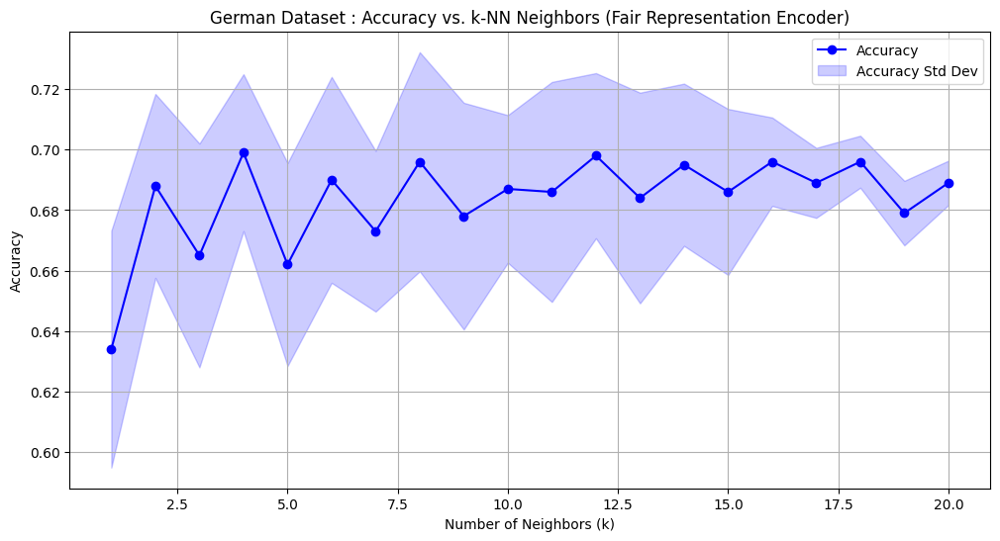

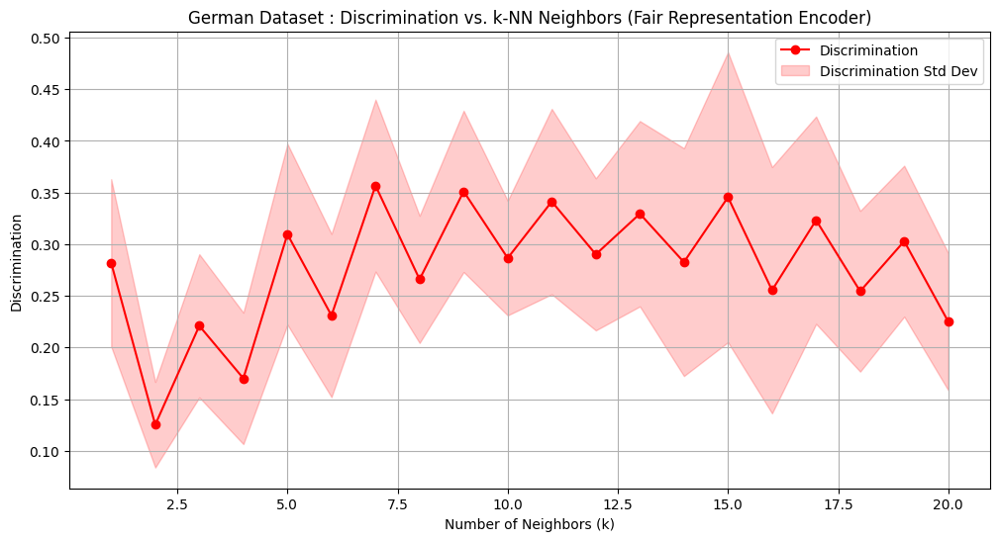

In [ ]:
# Define x-axis (assuming n_neighbors_range is known)
n_neighbors_range = range(1, len(mean_accuracy) + 1)  # Replace with your actual range if needed

# Plot accuracy with shaded region
plt.figure(figsize=(12, 6))
plt.plot(n_neighbors_range, mean_accuracy, label="Accuracy", color="blue", marker='o', linestyle='-')
plt.fill_between(
    n_neighbors_range,
    mean_accuracy - std_accuracy,
    mean_accuracy + std_accuracy,
    color="blue",
    alpha=0.2,
    label="Accuracy Std Dev"
)
plt.title("German Dataset : Accuracy vs. k-NN Neighbors (Fair Representation Encoder)")
plt.xlabel("Number of Neighbors (k)")
plt.ylabel("Accuracy")
plt.legend()
plt.grid(True)
plt.show()

# Plot discrimination with shaded region
plt.figure(figsize=(12, 6))
plt.plot(n_neighbors_range, mean_discrimination, label="Discrimination", color="red", marker='o', linestyle='-')
plt.fill_between(
    n_neighbors_range,
    mean_discrimination - std_discrimination,
    mean_discrimination + std_discrimination,
    color="red",
    alpha=0.2,
    label="Discrimination Std Dev"
)
plt.title("German Dataset : Discrimination vs. k-NN Neighbors (Fair Representation Encoder)")
plt.xlabel("Number of Neighbors (k)")
plt.ylabel("Discrimination")
plt.legend()
plt.grid(True)
plt.show()

## Variational Fair Encoder

Our adaptation and novel approach based on [inset link here]

In [ ]:
# Define the Encoder to produce a single embedding Z
class Encoder(nn.Module):
    def __init__(self, input_dim, latent_dim):
        super(Encoder, self).__init__()
        self.fc1 = nn.Linear(input_dim, 128)
        self.fc_mu = nn.Linear(128, latent_dim)
        self.fc_logvar = nn.Linear(128, latent_dim)

    def forward(self, x):
        h = torch.relu(self.fc1(x))
        mu = self.fc_mu(h)
        logvar = self.fc_logvar(h)
        return mu, logvar

# Define the Decoder
class Decoder(nn.Module):
    def __init__(self, latent_dim, output_dim):
        super(Decoder, self).__init__()
        self.fc1 = nn.Linear(latent_dim, 128)
        self.fc2 = nn.Linear(128, output_dim)

    def forward(self, z):
        h = torch.relu(self.fc1(z))
        return torch.sigmoid(self.fc2(h))

# Define the VIB Autoencoder with a single embedding Z
class VIBAutoencoder(nn.Module):
    def __init__(self, input_dim, latent_dim, output_dim, sensitive_dim):
        super(VIBAutoencoder, self).__init__()
        self.encoder = Encoder(input_dim, latent_dim)
        self.decoder = Decoder(latent_dim, output_dim)
        self.sensitive_dim = sensitive_dim  # The index of the sensitive dimension in Z

    def forward(self, x):
        mu, logvar = self.encoder(x)

        # Reparameterization trick
        std = torch.exp(0.5 * logvar)
        eps = torch.randn_like(std)
        z = mu + eps * std

        recon_x = self.decoder(z)
        return recon_x, mu, logvar, z

# Define the modified VIB loss with selective KL-divergence for a single sensitive dimension
def modified_vib_loss(recon_x, x, mu, logvar, sensitive_dim, beta=0.01, gamma = 0.1):
    # Reconstruction loss (Binary Cross-Entropy for normalized inputs)
    recon_loss = nn.functional.binary_cross_entropy(recon_x, x, reduction='sum')

    # KL-divergence regularization for the sensitive dimension
    kl_div_mask = -0.5 * torch.sum(1 + logvar[:, sensitive_dim] - mu[:, sensitive_dim].pow(2) - logvar[:, sensitive_dim].exp())

    # Minimal or no KL-divergence regularization for non-sensitive dimensions
    kl_div_non_mask = -0.5 * torch.sum(1 + logvar[:, :] - mu[:, :].pow(2) - logvar[:, :].exp()) - kl_div_mask

    # VIB loss with selective regularization
    return recon_loss + gamma * kl_div_mask + beta * kl_div_non_mask



In [ ]:
def normalize_columns(tensor):
    min_vals = tensor.min(dim=0, keepdim=True).values  # Minimum values for each column
    max_vals = tensor.max(dim=0, keepdim=True).values  # Maximum values for each column
    normalized_tensor = (tensor - min_vals) / (max_vals - min_vals)  # Normalize to [0, 1]
    return normalized_tensor

In [ ]:
def generate_embeddings(model, data_loader):
    model.eval()  # Set model to evaluation mode
    embeddings = []

    with torch.no_grad():  # Disable gradient calculation
        for batch in data_loader:
            x_batch = batch[0]

            # Forward pass through encoder to get mean and log-variance
            mu, logvar = model.encoder(x_batch)

            # Reparameterization trick to sample the latent vector z
            std = torch.exp(0.5 * logvar)
            eps = torch.randn_like(std)
            z = mu + eps * std  # Embedding z

            embeddings.append(z)

    # Concatenate all embeddings into a single tensor
    embeddings = torch.cat(embeddings, dim=0)
    return embeddings

### VAE on adult dataset

In [ ]:
X_train_adult_tensor_norm = normalize_columns(X_train_adult_tensor)

NameError: name 'normalize_columns' is not defined

In [ ]:
X_test_adult_tensor_norm = normalize_columns(X_test_adult_tensor)

In [ ]:
# Sample dataset (D) with sensitive attribute (S)
# Assuming dataset X and sensitive mask S are already defined, e.g., as in previous examples

# Define model parameters
input_dim = X_train_adult_np.shape[1]
latent_dim = 14
sensitive_dim = 0  # Index of the sensitive dimension in Z
output_dim = X_train_adult_np.shape[1]
batch_size = 32
num_epochs = 10
learning_rate = 1e-3

# Initialize model, optimizer, and dataloader
model = VIBAutoencoder(input_dim, latent_dim, output_dim, sensitive_dim)
optimizer = optim.Adam(model.parameters(), lr=learning_rate)
train_loader = DataLoader(TensorDataset(X_train_adult_tensor_norm), batch_size=batch_size, shuffle=True)

# Training loop
for epoch in range(num_epochs):
    model.train()
    total_loss = 0
    for batch in train_loader:
        x_batch = batch[0]

        # Forward pass
        recon_x, mu, logvar, z = model(x_batch)

        # Compute loss with selective KL-divergence for a single sensitive dimension
        loss = modified_vib_loss(recon_x, x_batch, mu, logvar, sensitive_dim, beta=0.01)

        # Backward and optimize
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        total_loss += loss.item()

    # Logging
    avg_loss = total_loss / len(train_loader.dataset)
    print(f"Epoch [{epoch+1}/{num_epochs}], Loss: {avg_loss:.4f}")

print("Training completed.")

In [ ]:
X_train_adult_embs = generate_embeddings(model, train_loader)

In [ ]:
test_loader = DataLoader(TensorDataset(X_test_adult_tensor_norm), batch_size=batch_size, shuffle=True)

In [ ]:
X_test_adult_embs = generate_embeddings(model, test_loader)

In [ ]:
print(X_train_adult_embs.shape)

In [ ]:
X_train_adult_embs = X_train_adult_embs.detach().numpy()

In [ ]:
print(X_test_adult_np.shape)

In [ ]:
accuracy_scores, discrimination_scores = evaluate_knn_with_discrimination(
    X_train_adult_embs, X_test_adult_embs, y_train_adult_np, y_test_adult_np, sensitive_train_adult_np, sensitive_test_adult_np, n_neighbors_range
)
test_results["Adult"]["Variational Fair Encoder"] = {"accuracy": accuracy_scores, "discrimination": discrimination_scores}

In [ ]:
print(discrimination_scores)

In [ ]:
print(accuracy_scores)

In [ ]:
x_label = "Number of Neighbors (N)"
y_label = "Accuracy"
graph_title = "Accuracy vs. Number of Neighbors in Variational Fair Encoder (Adult Data)"
plot_single_knn_results(x_label, y_label, graph_title, n_neighbors_range, accuracy_scores)

x_label = "Number of Neighbors (N)"
y_label = "Discrimination"
graph_title = "Discrimination vs. Number of Neighbors in Variational Fair Encoder (Adult Data)"
plot_single_knn_results(x_label, y_label, graph_title, n_neighbors_range, discrimination_scores, color='r')

## Trials

In [ ]:

num_trials = 5

for trial in range(num_trials):
    X_train_adult_tensor_norm = normalize_columns(X_train_adult_tensor)
    X_test_adult_tensor_norm = normalize_columns(X_test_adult_tensor)
    # Sample dataset (D) with sensitive attribute (S)
# Assuming dataset X and sensitive mask S are already defined, e.g., as in previous examples

    # Define model parameters
    input_dim = X_train_adult_np.shape[1]
    latent_dim = 14
    sensitive_dim = 0  # Index of the sensitive dimension in Z
    output_dim = X_train_adult_np.shape[1]
    batch_size = 32
    num_epochs = 10
    learning_rate = 1e-3

    # Initialize model, optimizer, and dataloader
    model = VIBAutoencoder(input_dim, latent_dim, output_dim, sensitive_dim)
    optimizer = optim.Adam(model.parameters(), lr=learning_rate)
    train_loader = DataLoader(TensorDataset(X_train_adult_tensor_norm), batch_size=batch_size, shuffle=True)

    # Training loop
    for epoch in range(num_epochs):
        model.train()
        total_loss = 0
        for batch in train_loader:
            x_batch = batch[0]

            # Forward pass
            recon_x, mu, logvar, z = model(x_batch)

            # Compute loss with selective KL-divergence for a single sensitive dimension
            loss = modified_vib_loss(recon_x, x_batch, mu, logvar, sensitive_dim, beta=0.001, gamma = 0.00001)

            # Backward and optimize
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            total_loss += loss.item()

        # Logging
        avg_loss = total_loss / len(train_loader.dataset)
        print(f"Epoch [{epoch+1}/{num_epochs}], Loss: {avg_loss:.4f}")

    print("Training completed.")
    X_train_adult_embs = generate_embeddings(model, train_loader)
    test_loader = DataLoader(TensorDataset(X_test_adult_tensor_norm), batch_size=batch_size, shuffle=True)
    X_test_adult_embs = generate_embeddings(model, test_loader)
    X_train_adult_embs = X_train_adult_embs.detach().numpy()
    accuracy_scores, discrimination_scores = evaluate_knn_with_discrimination(
        X_train_adult_embs, X_test_adult_embs, y_train_adult_np, y_test_adult_np, sensitive_train_adult_np, sensitive_test_adult_np, n_neighbors_range
    )
    trial_results["Adult"]["Variational Fair Encoder"][f'trial {trial}'] = {"accuracy": accuracy_scores, "discrimination": discrimination_scores}

Epoch [1/10], Loss: 5.2551
Epoch [2/10], Loss: 4.7350
Epoch [3/10], Loss: 4.6938
Epoch [4/10], Loss: 4.6800
Epoch [5/10], Loss: 4.6712
Epoch [6/10], Loss: 4.6651
Epoch [7/10], Loss: 4.6608
Epoch [8/10], Loss: 4.6576
Epoch [9/10], Loss: 4.6553
Epoch [10/10], Loss: 4.6541
Training completed.
Epoch [1/10], Loss: 5.2349
Epoch [2/10], Loss: 4.7280
Epoch [3/10], Loss: 4.6928
Epoch [4/10], Loss: 4.6794
Epoch [5/10], Loss: 4.6709
Epoch [6/10], Loss: 4.6649
Epoch [7/10], Loss: 4.6605
Epoch [8/10], Loss: 4.6576
Epoch [9/10], Loss: 4.6556
Epoch [10/10], Loss: 4.6540
Training completed.
Epoch [1/10], Loss: 5.2342
Epoch [2/10], Loss: 4.7236
Epoch [3/10], Loss: 4.6932
Epoch [4/10], Loss: 4.6801
Epoch [5/10], Loss: 4.6716
Epoch [6/10], Loss: 4.6662
Epoch [7/10], Loss: 4.6624
Epoch [8/10], Loss: 4.6595
Epoch [9/10], Loss: 4.6575
Epoch [10/10], Loss: 4.6557
Training completed.
Epoch [1/10], Loss: 5.2346
Epoch [2/10], Loss: 4.7295
Epoch [3/10], Loss: 4.6942
Epoch [4/10], Loss: 4.6800
Epoch [5/10], Loss:

In [ ]:

vae_results = trial_results["Adult"]["Variational Fair Encoder"]
num_trials = len(vae_results)

accuracy_scores_trials = []
discrimination_scores_trials = []

for trial_key in vae_results.keys():
    accuracy_scores_trials.append(vae_results[trial_key]["accuracy"])
    discrimination_scores_trials.append(vae_results[trial_key]["discrimination"])

accuracy_scores_trials = np.array(accuracy_scores_trials)
discrimination_scores_trials = np.array(discrimination_scores_trials)

mean_accuracy = np.mean(accuracy_scores_trials, axis=0)
std_accuracy = np.std(accuracy_scores_trials, axis=0)

mean_discrimination = np.mean(discrimination_scores_trials, axis=0)
std_discrimination = np.std(discrimination_scores_trials, axis=0)



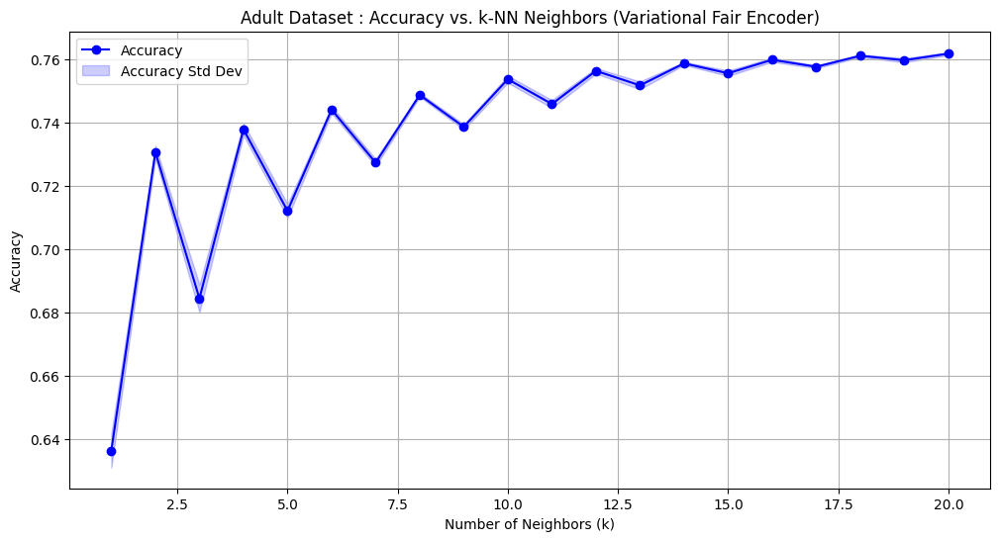

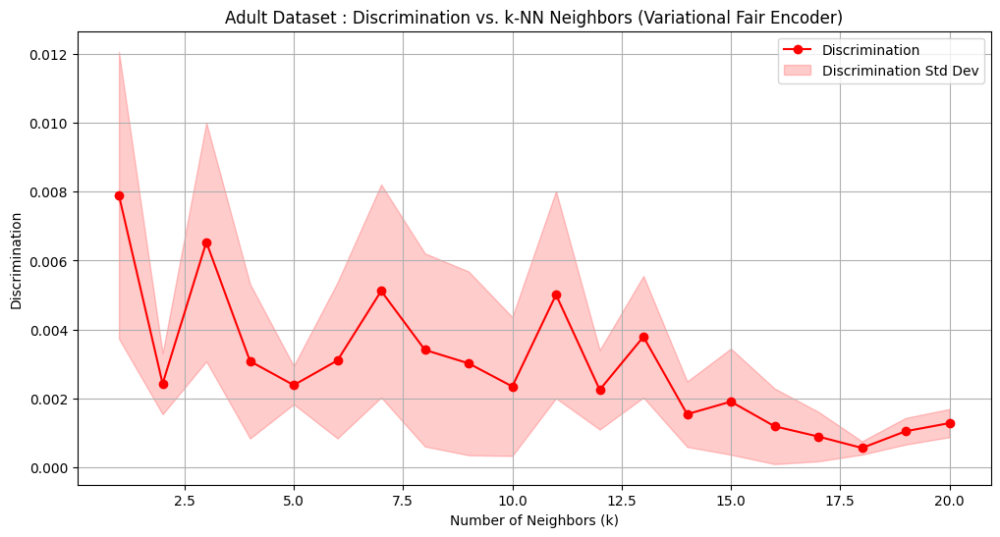

In [ ]:

# Define x-axis (assuming n_neighbors_range is known)
n_neighbors_range = range(1, len(mean_accuracy) + 1)  # Replace with your actual range if needed

# Plot accuracy with shaded region
plt.figure(figsize=(12, 6))
plt.plot(n_neighbors_range, mean_accuracy, label="Accuracy", color="blue", marker='o', linestyle='-')
plt.fill_between(
    n_neighbors_range,
    mean_accuracy - std_accuracy,
    mean_accuracy + std_accuracy,
    color="blue",
    alpha=0.2,
    label="Accuracy Std Dev"
)
plt.title("Adult Dataset : Accuracy vs. k-NN Neighbors (Variational Fair Encoder)")
plt.xlabel("Number of Neighbors (k)")
plt.ylabel("Accuracy")
plt.legend()
plt.grid(True)
plt.show()

# Plot discrimination with shaded region
plt.figure(figsize=(12, 6))
plt.plot(n_neighbors_range, mean_discrimination, label="Discrimination", color="red", marker='o', linestyle='-')
plt.fill_between(
    n_neighbors_range,
    mean_discrimination - std_discrimination,
    mean_discrimination + std_discrimination,
    color="red",
    alpha=0.2,
    label="Discrimination Std Dev"
)
plt.title("Adult Dataset : Discrimination vs. k-NN Neighbors (Variational Fair Encoder)")
plt.xlabel("Number of Neighbors (k)")
plt.ylabel("Discrimination")
plt.legend()
plt.grid(True)
plt.show()

### VAE on German dataset

In [ ]:
X_train_ger_tensor_norm = normalize_columns(X_train_ger_tensor)

In [ ]:
X_test_ger_tensor_norm = normalize_columns(X_test_ger_tensor)

In [ ]:
# Sample dataset (D) with sensitive attribute (S)
# Assuming dataset X and sensitive mask S are already defined, e.g., as in previous examples

# Define model parameters
input_dim = X_train_ger_np.shape[1]
latent_dim = 14
sensitive_dim = 0  # Index of the sensitive dimension in Z
output_dim = X_train_ger_np.shape[1]
batch_size = 32
num_epochs = 10
learning_rate = 1e-3

# Initialize model, optimizer, and dataloader
model = VIBAutoencoder(input_dim, latent_dim, output_dim, sensitive_dim)
optimizer = optim.Adam(model.parameters(), lr=learning_rate)
train_loader = DataLoader(TensorDataset(X_train_ger_tensor_norm), batch_size=batch_size, shuffle=True)

# Training loop
for epoch in range(num_epochs):
    model.train()
    total_loss = 0
    for batch in train_loader:
        x_batch = batch[0]

        # Forward pass
        recon_x, mu, logvar, z = model(x_batch)

        # Compute loss with selective KL-divergence for a single sensitive dimension
        loss = modified_vib_loss(recon_x, x_batch, mu, logvar, sensitive_dim, beta=0.01)

        # Backward and optimize
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        total_loss += loss.item()

    # Logging
    avg_loss = total_loss / len(train_loader.dataset)
    print(f"Epoch [{epoch+1}/{num_epochs}], Loss: {avg_loss:.4f}")

print("Training completed.")

In [ ]:
X_train_ger_embs = generate_embeddings(model, train_loader)

In [ ]:
test_loader = DataLoader(TensorDataset(X_test_ger_tensor_norm), batch_size=batch_size, shuffle=True)

In [ ]:
X_test_ger_embs = generate_embeddings(model, test_loader)

In [ ]:
print(X_train_ger_embs.shape)

In [ ]:
X_train_ger_embs = X_train_ger_embs.detach().numpy()

In [ ]:
print(X_test_ger_np.shape)

In [ ]:
accuracy_scores, discrimination_scores = evaluate_knn_with_discrimination(
    X_train_ger_embs, X_test_ger_embs, y_train_ger_np, y_test_ger_np, sensitive_train_ger_np, sensitive_test_ger_np, n_neighbors_range
)
test_results["German"]["Variational Fair Encoder"] = {"accuracy": accuracy_scores, "discrimination": discrimination_scores}

In [ ]:
print(discrimination_scores)

In [ ]:
print(accuracy_scores)

In [ ]:
x_label = "Number of Neighbors (N)"
y_label = "Accuracy"
graph_title = "Accuracy vs. Number of Neighbors in Variational Fair Encoder (German Credit Data)"
plot_single_knn_results(x_label, y_label, graph_title, n_neighbors_range, accuracy_scores)

x_label = "Number of Neighbors (N)"
y_label = "Discrimination"
graph_title = "Discrimination vs. Number of Neighbors in Variational Fair Encoder (German Credit Data)"
plot_single_knn_results(x_label, y_label, graph_title, n_neighbors_range, discrimination_scores, color='r')

## Trials

In [ ]:

num_trials = 5

for trial in range(num_trials):
    X_train_ger_tensor_norm = normalize_columns(X_train_ger_tensor)
    X_test_ger_tensor_norm = normalize_columns(X_test_ger_tensor)

    # Sample dataset (D) with sensitive attribute (S)
    # Assuming dataset X and sensitive mask S are already defined, e.g., as in previous examples

    # Define model parameters
    input_dim = X_train_ger_np.shape[1]
    latent_dim = 14
    sensitive_dim = 0  # Index of the sensitive dimension in Z
    output_dim = X_train_ger_np.shape[1]
    batch_size = 32
    num_epochs = 10
    learning_rate = 1e-3

    # Initialize model, optimizer, and dataloader
    model = VIBAutoencoder(input_dim, latent_dim, output_dim, sensitive_dim)
    optimizer = optim.Adam(model.parameters(), lr=learning_rate)
    train_loader = DataLoader(TensorDataset(X_train_ger_tensor_norm), batch_size=batch_size, shuffle=True)

    # Training loop
    for epoch in range(num_epochs):
        model.train()
        total_loss = 0
        for batch in train_loader:
            x_batch = batch[0]

            # Forward pass
            recon_x, mu, logvar, z = model(x_batch)

            # Compute loss with selective KL-divergence for a single sensitive dimension
            loss = modified_vib_loss(recon_x, x_batch, mu, logvar, sensitive_dim, beta=0.001, gamma = 0.00001)

            # Backward and optimize
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            total_loss += loss.item()

        # Logging
        avg_loss = total_loss / len(train_loader.dataset)
        print(f"Epoch [{epoch+1}/{num_epochs}], Loss: {avg_loss:.4f}")

    print("Training completed.")
    X_train_ger_embs = generate_embeddings(model, train_loader)
    test_loader = DataLoader(TensorDataset(X_test_ger_tensor_norm), batch_size=batch_size, shuffle=True)
    X_test_ger_embs = generate_embeddings(model, test_loader)
    X_train_ger_embs = X_train_ger_embs.detach().numpy()

    accuracy_scores, discrimination_scores = evaluate_knn_with_discrimination(
        X_train_ger_embs, X_test_ger_embs, y_train_ger_np, y_test_ger_np, sensitive_train_ger_np, sensitive_test_ger_np, n_neighbors_range
    )
    trial_results["German"]["Variational Fair Encoder"][f'trial {trial}'] = {"accuracy": accuracy_scores, "discrimination": discrimination_scores}


Epoch [1/10], Loss: 12.5590
Epoch [2/10], Loss: 10.8365
Epoch [3/10], Loss: 10.5045
Epoch [4/10], Loss: 10.2747
Epoch [5/10], Loss: 9.9451
Epoch [6/10], Loss: 9.4334
Epoch [7/10], Loss: 8.8551
Epoch [8/10], Loss: 8.3146
Epoch [9/10], Loss: 7.8915
Epoch [10/10], Loss: 7.5103
Training completed.
Epoch [1/10], Loss: 12.7498
Epoch [2/10], Loss: 10.8178
Epoch [3/10], Loss: 10.4911
Epoch [4/10], Loss: 10.3237
Epoch [5/10], Loss: 10.0131
Epoch [6/10], Loss: 9.5205
Epoch [7/10], Loss: 8.8822
Epoch [8/10], Loss: 8.2805
Epoch [9/10], Loss: 7.7903
Epoch [10/10], Loss: 7.3719
Training completed.
Epoch [1/10], Loss: 12.3524
Epoch [2/10], Loss: 10.6898
Epoch [3/10], Loss: 10.4614
Epoch [4/10], Loss: 10.2304
Epoch [5/10], Loss: 9.8758
Epoch [6/10], Loss: 9.2851
Epoch [7/10], Loss: 8.7045
Epoch [8/10], Loss: 8.1874
Epoch [9/10], Loss: 7.7442
Epoch [10/10], Loss: 7.3339
Training completed.
Epoch [1/10], Loss: 12.3288
Epoch [2/10], Loss: 10.7353
Epoch [3/10], Loss: 10.4754
Epoch [4/10], Loss: 10.2762
Ep

In [ ]:
german_results = trial_results["German"]["Variational Fair Encoder"]
num_trials = len(german_results)

accuracy_scores_trials = []
discrimination_scores_trials = []

for trial_key in german_results.keys():
    accuracy_scores_trials.append(german_results[trial_key]["accuracy"])
    discrimination_scores_trials.append(german_results[trial_key]["discrimination"])

accuracy_scores_trials = np.array(accuracy_scores_trials)
discrimination_scores_trials = np.array(discrimination_scores_trials)

mean_accuracy = np.mean(accuracy_scores_trials, axis=0)
std_accuracy = np.std(accuracy_scores_trials, axis=0)

mean_discrimination = np.mean(discrimination_scores_trials, axis=0)
std_discrimination = np.std(discrimination_scores_trials, axis=0)


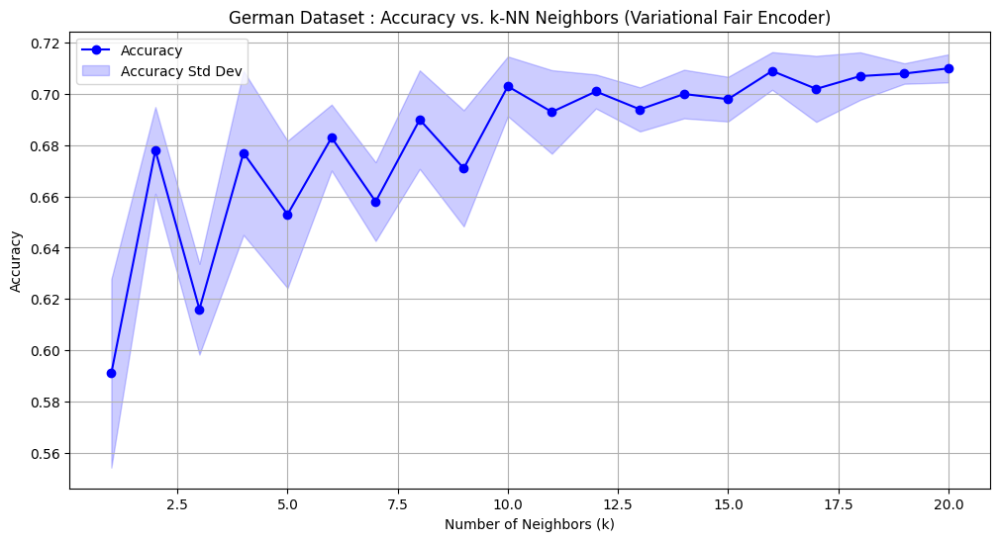

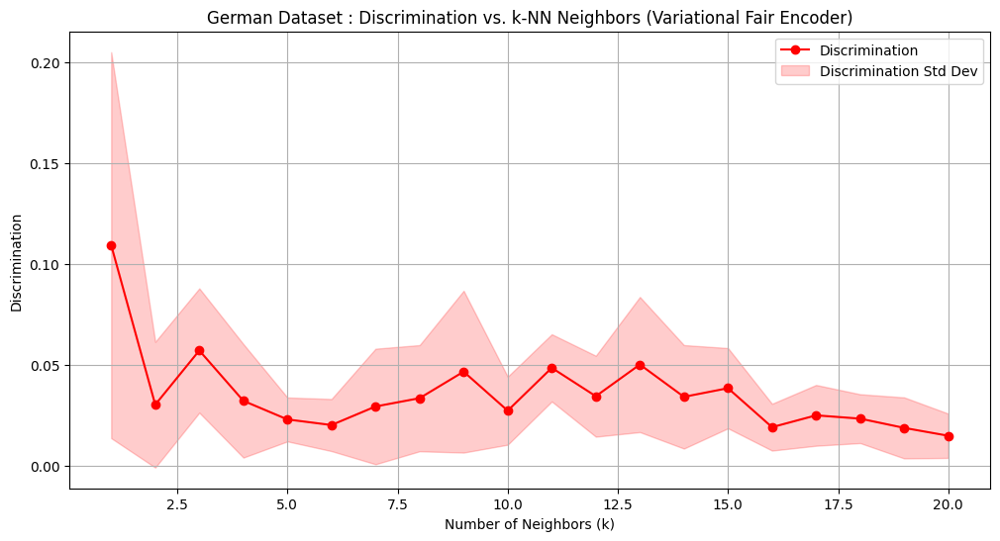

In [ ]:

# Define x-axis (assuming n_neighbors_range is known)
n_neighbors_range = range(1, len(mean_accuracy) + 1)  # Replace with your actual range if needed

# Plot accuracy with shaded region
plt.figure(figsize=(12, 6))
plt.plot(n_neighbors_range, mean_accuracy, label="Accuracy", color="blue", marker='o', linestyle='-')
plt.fill_between(
    n_neighbors_range,
    mean_accuracy - std_accuracy,
    mean_accuracy + std_accuracy,
    color="blue",
    alpha=0.2,
    label="Accuracy Std Dev"
)
plt.title("German Dataset : Accuracy vs. k-NN Neighbors (Variational Fair Encoder)")
plt.xlabel("Number of Neighbors (k)")
plt.ylabel("Accuracy")
plt.legend()
plt.grid(True)
plt.show()

# Plot discrimination with shaded region
plt.figure(figsize=(12, 6))
plt.plot(n_neighbors_range, mean_discrimination, label="Discrimination", color="red", marker='o', linestyle='-')
plt.fill_between(
    n_neighbors_range,
    mean_discrimination - std_discrimination,
    mean_discrimination + std_discrimination,
    color="red",
    alpha=0.2,
    label="Discrimination Std Dev"
)
plt.title("German Dataset : Discrimination vs. k-NN Neighbors (Variational Fair Encoder)")
plt.xlabel("Number of Neighbors (k)")
plt.ylabel("Discrimination")
plt.legend()
plt.grid(True)
plt.show()


# Overlapping Graphs (Run After our tests (all above section))

In [ ]:
print(test_results,"\n")

# confirm the data
for key, value in test_results.items():
  print(key)
  for key2, value2 in value.items():
    print("\t",key2)
    for key3, value3 in value2.items():
      print("\t\t",key3, ", a list of length:", len(value3))

In [ ]:
def plot_overlapping_results(test_results:dict, metric_to_plot:str="accuracy") -> None:
  """
  input:
    - test results
    - metric to plot (default: accuracy), to specify either accuracy or discrimination
  output: none, but prints plots of the results
  """
  x_vals = n_neighbors_range
  for dataset_name, dataset_results in test_results.items():
    # print(f"Dataset: {dataset_name}")
    plt.figure(figsize=(10, 6))
    for model_name, model_results in dataset_results.items():
      # print(f"Model: {model_name}")
      plt.plot(x_vals, model_results[metric_to_plot], label=model_name)
    plt.xlabel("Number of Neighbors")
    y_label = "Accuracy" if metric_to_plot == "accuracy" else "Discrimination Score"
    plt.ylabel(y_label)
    plt.title(f"{y_label} vs. Number of Neighbors in k-NN ({dataset_name} Dataset)")
    plt.legend()
    plt.grid(True)
    plt.show()

In [ ]:
plot_overlapping_results(test_results)

In [ ]:
plot_overlapping_results(test_results, "discrimination")

In [ ]:
print(trial_results.keys())
print(trial_results['Adult'].keys())
print(trial_results['Adult']['Auto-Encoder'].keys())

dict_keys(['Adult', 'German'])
dict_keys(['Auto-Encoder', 'Fair Representation Encoder', 'Variational Fair Encoder'])
dict_keys(['trial 0', 'trial 1', 'trial 2', 'trial 3', 'trial 4'])


In [ ]:

def compute_stats(results, encoder_type, metric):
    scores_trials = []
    for trial_key in results[encoder_type].keys():
        scores_trials.append(results[encoder_type][trial_key][metric])
    scores_trials = np.array(scores_trials)
    mean_scores = np.mean(scores_trials, axis=0)
    std_scores = np.std(scores_trials, axis=0)
    return mean_scores, std_scores

n_neighbors_range = range(1, 21)

def plot_metric(dataset_name, metric, ylabel, trial_results):
    plt.figure(figsize=(12, 6))
    for method in trial_results[dataset_name].keys():
        mean_scores, std_scores = compute_stats(trial_results[dataset_name], method, metric)
        plt.plot(n_neighbors_range, mean_scores, label=method, marker="o")
        plt.fill_between(
            n_neighbors_range,
            mean_scores - std_scores,
            mean_scores + std_scores,
            alpha=0.2
        )
    plt.plot(n_neighbors_range, test_results[dataset_name]['K-Nearest Neighbors'][metric], label='Base K-Nearest Neighbors on Raw Data', marker="o")
    plt.title(f"{metric.capitalize()} for {dataset_name} Dataset")
    plt.xlabel("Number of Neighbors (k)")
    plt.ylabel(ylabel)
    plt.legend()
    plt.grid(True)
    plt.show()


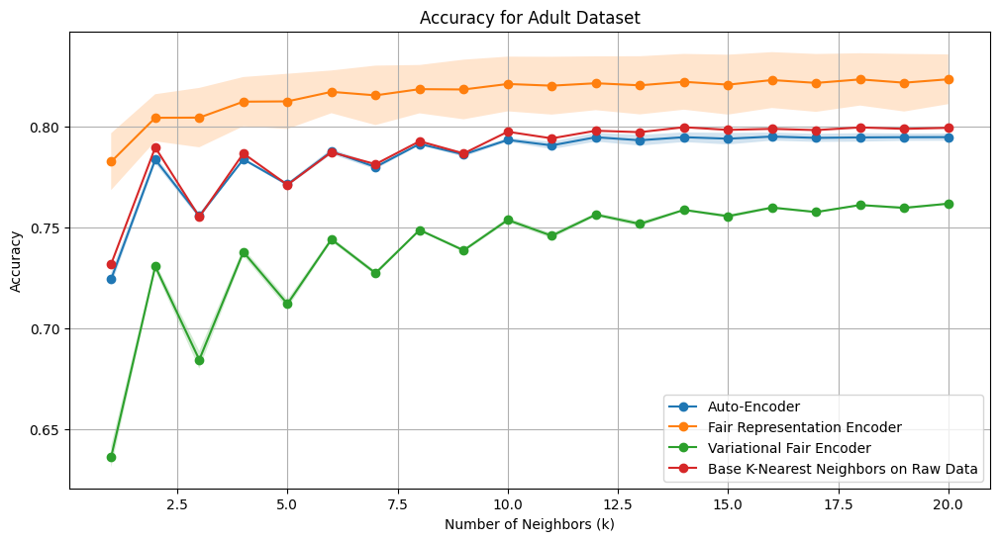

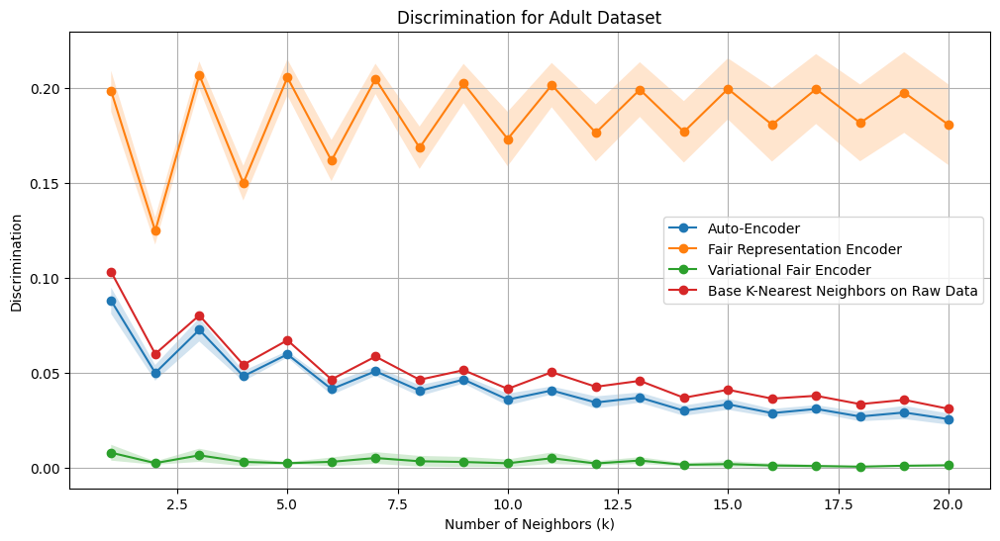

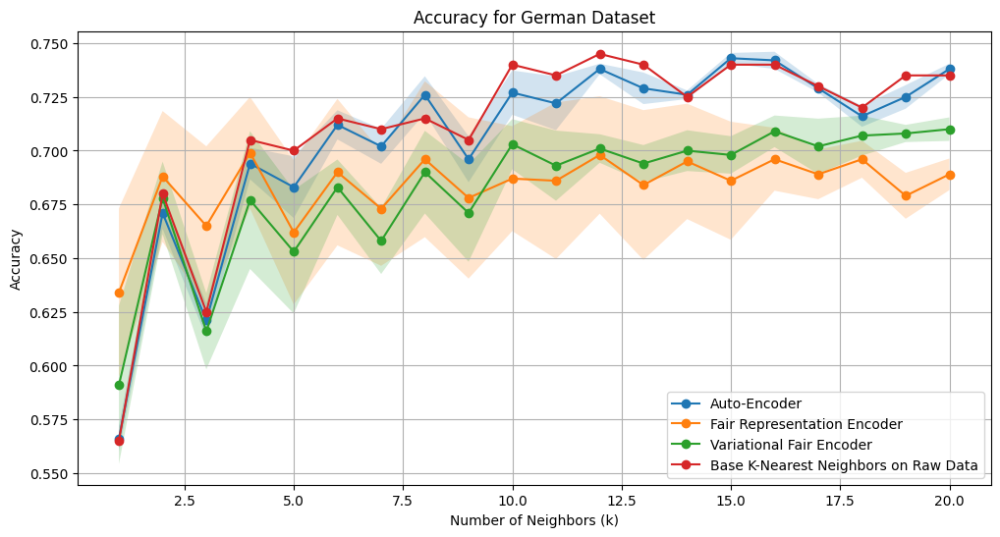

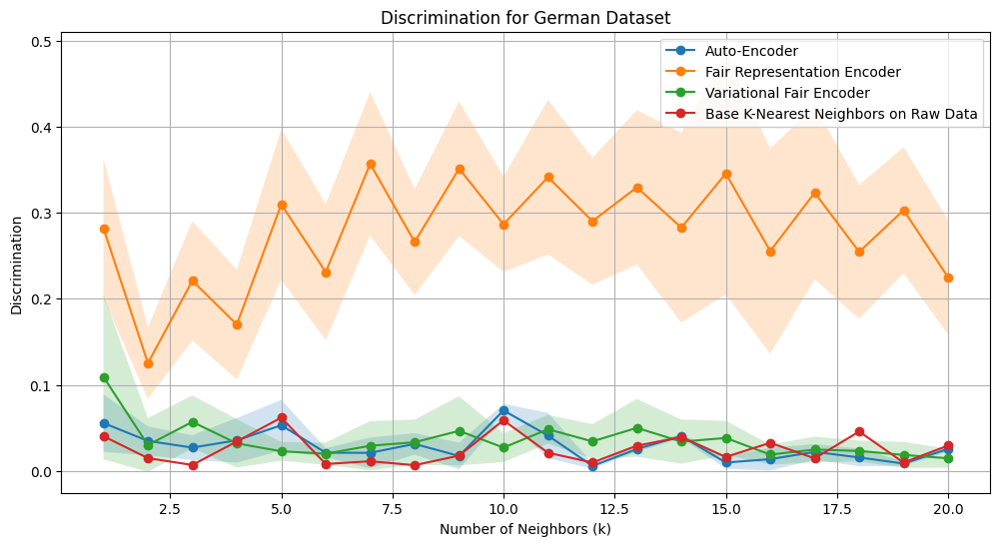

In [ ]:

plot_metric("Adult", "accuracy", "Accuracy", trial_results)
plot_metric("Adult", "discrimination", "Discrimination", trial_results)

plot_metric("German", "accuracy", "Accuracy", trial_results)
plot_metric("German", "discrimination", "Discrimination", trial_results)

# Hyperparameter optimization on VAE

In [ ]:
beta_range = np.logspace(-1, -7, num=7)
gamma_range = np.logspace(-1, -7, num=7)

In [ ]:
accuracy_results = np.zeros((len(beta_range), len(gamma_range)))
discrimination_results = np.zeros((len(beta_range), len(gamma_range)))

In [ ]:
n_neighbors_range = range(1, 21, 5)  # N from 1 to 20, step = 5

for i, beta in enumerate(beta_range):
    for j, gamma in enumerate(gamma_range):
        # Train the VAE model with the current beta and gamma
        # (Add training loop here as per your model setup)
        input_dim = X_train_adult_np.shape[1]
        latent_dim = 14
        sensitive_dim = 0  # Index of the sensitive dimension in Z
        output_dim = X_train_adult_np.shape[1]
        batch_size = 32
        num_epochs = 10
        learning_rate = 1e-3

        # Initialize model, optimizer, and dataloader
        model = VIBAutoencoder(input_dim, latent_dim, output_dim, sensitive_dim)
        optimizer = optim.Adam(model.parameters(), lr=learning_rate)
        train_loader = DataLoader(TensorDataset(X_train_adult_tensor_norm), batch_size=batch_size, shuffle=True)

        # Training loop
        for epoch in range(num_epochs):
            model.train()
            total_loss = 0
            for batch in train_loader:
                x_batch = batch[0]

                # Forward pass
                recon_x, mu, logvar, z = model(x_batch)

                # Compute loss with selective KL-divergence for a single sensitive dimension
                loss = modified_vib_loss(recon_x, x_batch, mu, logvar, sensitive_dim, beta = beta, gamma = gamma)

                # Backward and optimize
                optimizer.zero_grad()
                loss.backward()
                optimizer.step()

                total_loss += loss.item()

            # Logging
            avg_loss = total_loss / len(train_loader.dataset)

        print(f"Training completed for gamma: {gamma}, beta: {beta}")

        # After training, generate embeddings with the VAE for both training and test sets
        X_train_adult_embs = generate_embeddings(model, train_loader)
        test_loader = DataLoader(TensorDataset(X_test_adult_tensor_norm), batch_size=batch_size, shuffle=True)
        X_test_adult_embs = generate_embeddings(model, test_loader)

        X_train_adult_embs = X_train_adult_embs.detach().numpy()

        # Evaluate with kNN and calculate accuracy and discrimination
        accuracy_scores, discrimination_scores = evaluate_knn_with_discrimination(
        X_train_adult_embs, X_test_adult_embs, y_train_adult_np, y_test_adult_np, sensitive_train_adult_np, sensitive_test_adult_np, n_neighbors_range
        )

        # Store the average accuracy and discrimination scores for the current beta and gamma
        accuracy_results[i, j] = np.mean(accuracy_scores)
        discrimination_results[i, j] = np.mean(discrimination_scores)

Training completed for gamma: 0.1, beta: 0.1
Training completed for gamma: 0.01, beta: 0.1
Training completed for gamma: 0.001, beta: 0.1
Training completed for gamma: 0.0001, beta: 0.1
Training completed for gamma: 1e-05, beta: 0.1
Training completed for gamma: 1e-06, beta: 0.1
Training completed for gamma: 1e-07, beta: 0.1
Training completed for gamma: 0.1, beta: 0.01
Training completed for gamma: 0.01, beta: 0.01
Training completed for gamma: 0.001, beta: 0.01
Training completed for gamma: 0.0001, beta: 0.01
Training completed for gamma: 1e-05, beta: 0.01
Training completed for gamma: 1e-06, beta: 0.01
Training completed for gamma: 1e-07, beta: 0.01
Training completed for gamma: 0.1, beta: 0.001
Training completed for gamma: 0.01, beta: 0.001
Training completed for gamma: 0.001, beta: 0.001
Training completed for gamma: 0.0001, beta: 0.001
Training completed for gamma: 1e-05, beta: 0.001
Training completed for gamma: 1e-06, beta: 0.001
Training completed for gamma: 1e-07, beta: 0.00

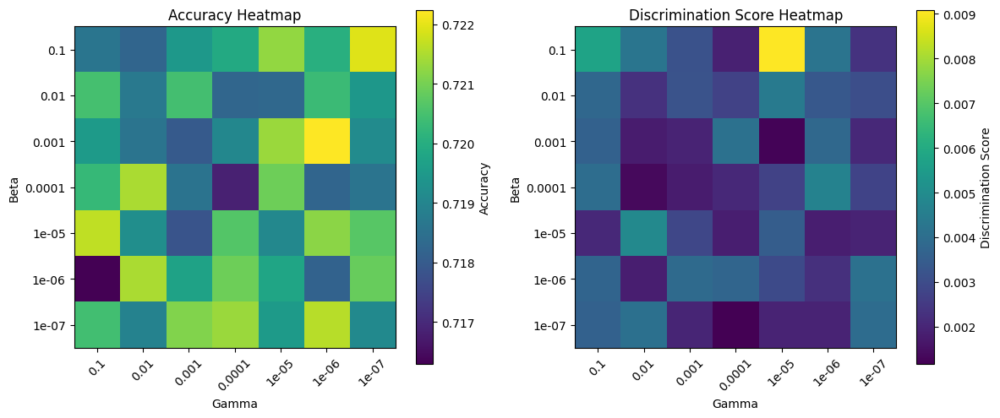

In [ ]:
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.imshow(accuracy_results, cmap="viridis", interpolation="nearest")
plt.colorbar(label="Accuracy")
plt.xticks(range(len(gamma_range)), np.round(gamma_range, 7), rotation=45)
plt.yticks(range(len(beta_range)), np.round(beta_range, 7))
plt.xlabel("Gamma")
plt.ylabel("Beta")
plt.title("Accuracy Heatmap")

plt.subplot(1, 2, 2)
plt.imshow(discrimination_results, cmap="viridis", interpolation="nearest")
plt.colorbar(label="Discrimination Score")
plt.xticks(range(len(gamma_range)), np.round(gamma_range, 7), rotation=45)
plt.yticks(range(len(beta_range)), np.round(beta_range, 7))
plt.xlabel("Gamma")
plt.ylabel("Beta")
plt.title("Discrimination Score Heatmap")

plt.tight_layout()
plt.show()

# Clustering


# ADULT

In [ ]:
vae_b = [0.1, 0.001, 0.00001, 0.0000001]
vae_g = [0.0000001, 0.00001, 0.1, 0.0001]
vae_xs = {}

for i, beta in enumerate(vae_b):
    gamma = vae_g[i]
    # Train the VAE model with the current beta and gamma
    # (Add training loop here as per your model setup)
    input_dim = X_train_adult_np.shape[1]
    latent_dim = 14
    sensitive_dim = 0  # Index of the sensitive dimension in Z
    output_dim = X_train_adult_np.shape[1]
    batch_size = 32
    num_epochs = 10
    learning_rate = 1e-3

    # Initialize model, optimizer, and dataloader
    model = VIBAutoencoder(input_dim, latent_dim, output_dim, sensitive_dim)
    optimizer = optim.Adam(model.parameters(), lr=learning_rate)
    train_loader = DataLoader(TensorDataset(X_train_adult_tensor_norm), batch_size=batch_size, shuffle=True)

    # Training loop
    for epoch in range(num_epochs):
        model.train()
        total_loss = 0
        for batch in train_loader:
            x_batch = batch[0]

            # Forward pass
            recon_x, mu, logvar, z = model(x_batch)

            # Compute loss with selective KL-divergence for a single sensitive dimension
            loss = modified_vib_loss(recon_x, x_batch, mu, logvar, sensitive_dim, beta = beta, gamma = gamma)

            # Backward and optimize
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            total_loss += loss.item()

        # Logging
        avg_loss = total_loss / len(train_loader.dataset)

    print(f"Training completed for gamma: {gamma}, beta: {beta}")

    # After training, generate embeddings with the VAE for both training and test sets
    X_train_adult_embs = generate_embeddings(model, train_loader)
    test_loader = DataLoader(TensorDataset(X_test_adult_tensor_norm), batch_size=batch_size, shuffle=True)
    X_test_adult_embs = generate_embeddings(model, test_loader)

    X_train_adult_embs = X_train_adult_embs.detach().numpy()
    vae_xs[f'Variational Fair Encoder (beta, gamma) = ({beta}, {gamma})'] = {'x_train' : X_train_adult_embs, 'x_test' : X_test_adult_embs, "sens_train": sensitive_train_adult_np, "sens_test" : sensitive_test_adult_np}

Training completed for gamma: 1e-07, beta: 0.1
Training completed for gamma: 1e-05, beta: 0.001
Training completed for gamma: 0.1, beta: 1e-05
Training completed for gamma: 0.0001, beta: 1e-07


In [ ]:
adult_xs = {
    'Raw Data' : {'x_train' : X_train_adult_np, 'x_test' : X_test_adult_np, "sens_train": sensitive_train_adult_np, "sens_test" : sensitive_test_adult_np},
    'Auto Encoder' : {'x_train' : X_train_encoded_adult, 'x_test' : X_test_encoded_adult, "sens_train": sensitive_train_adult_np, "sens_test" : sensitive_test_adult_np},
    'Fair Encoder' : {'x_train' : fair_embedded_train_adult_np, 'x_test' : fair_embedding_test_adult_np, "sens_train": sensitive_train_adult_np, "sens_test" : sensitive_test_adult_np},
    **vae_xs
}
# german data is same as variables here ^ except its _ger_ instead of _adult_

## WITH Y

In [ ]:
def tsne_cluster_plot(process, xs, ys, sens_label,sample_size=5000):

    x_train_with_y = np.hstack((xs['x_train'], ys['y_train']))
    x_test_with_y = np.hstack((xs['x_test'], ys['y_test']))

    X = np.vstack((x_train_with_y, x_test_with_y))
    sens = list(xs['sens_train']) + list(xs['sens_test'])

    sample_size = min(sample_size, len(X))

    X_tsne = TSNE(n_components=2, random_state=0).fit_transform(X[:sample_size])
    sens_subset = sens[:sample_size]

    unique_attrs = np.unique(sens_subset)
    colors = cm.viridis(np.linspace(0, 1, len(unique_attrs)))
    color_map = dict(zip(unique_attrs, colors))

    plt.figure(figsize=(7, 7))
    for attr in unique_attrs:
        indices = [i for i, s in enumerate(sens_subset) if s == attr]
        plt.scatter(
            X_tsne[indices, 0],
            X_tsne[indices, 1],
            label=f'{attr}',
            color=color_map[attr],
            alpha=0.7
        )

    plt.title(f't-SNE for {process}')
    plt.xlabel('X')
    plt.ylabel('Y')
    plt.legend(title=sens_label)
    plt.show()

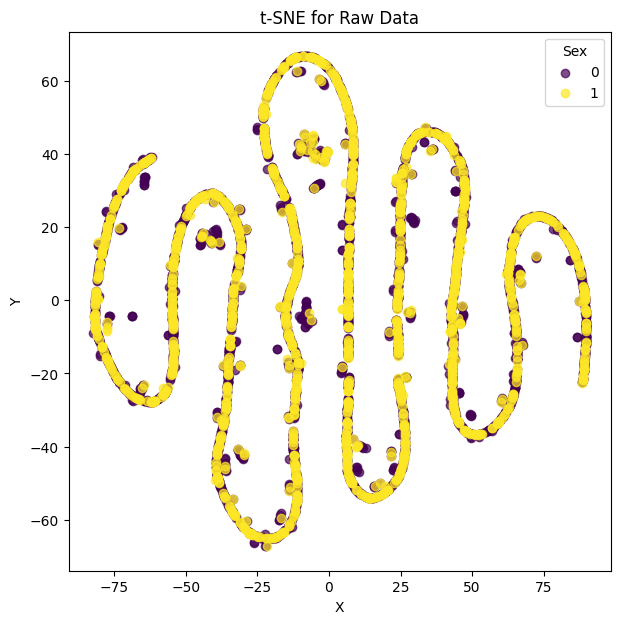

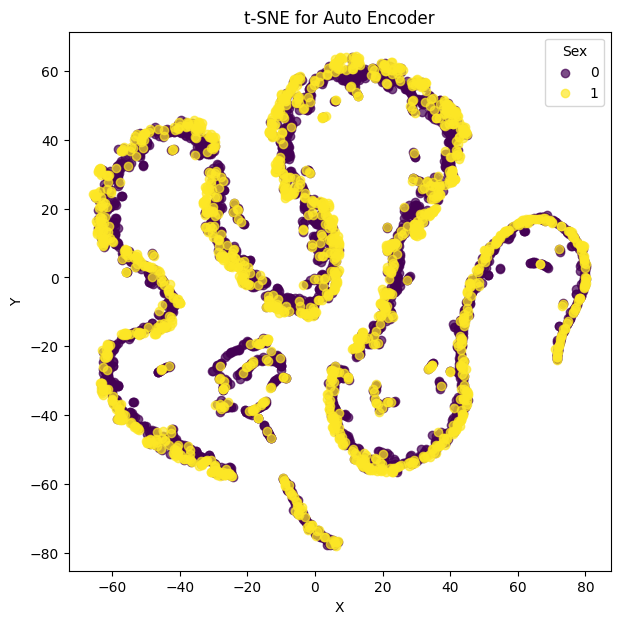

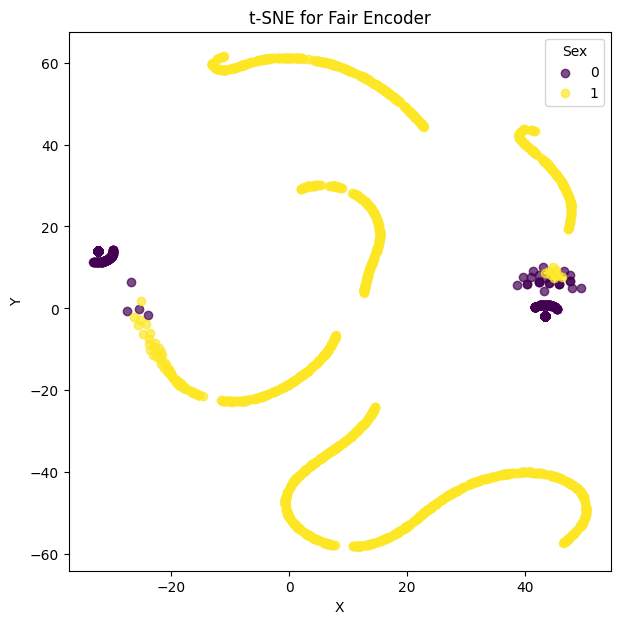

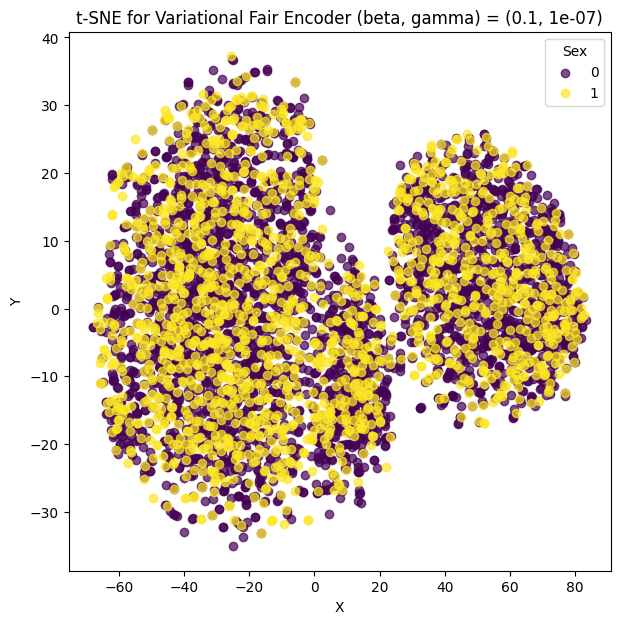

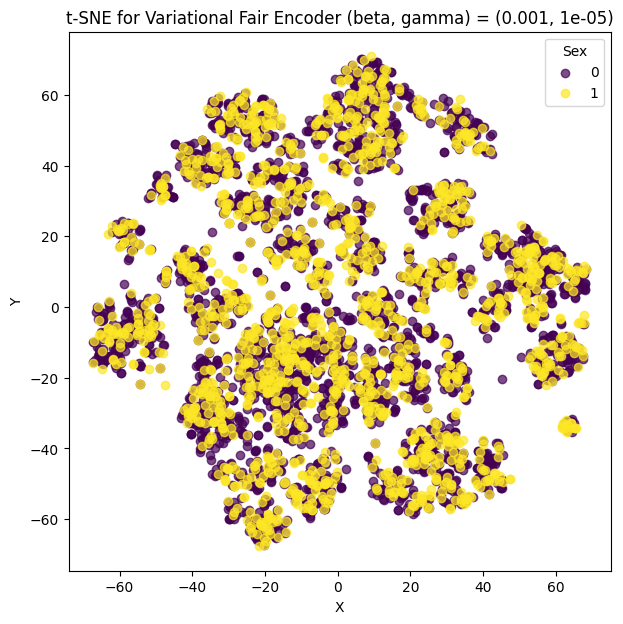

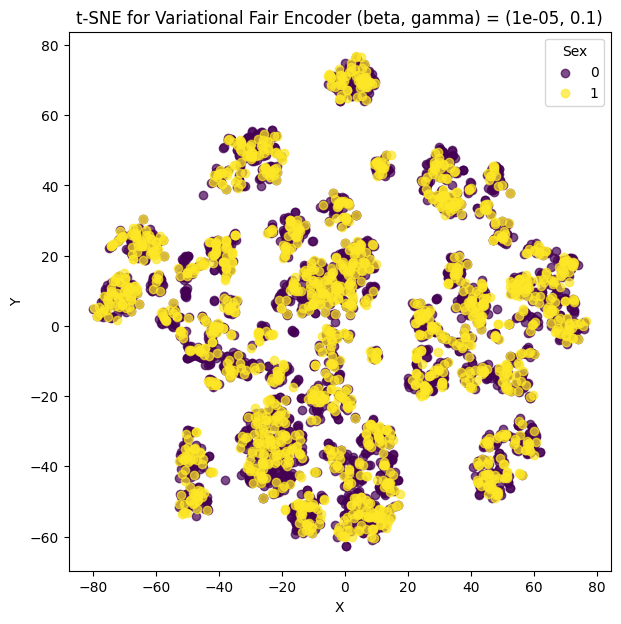

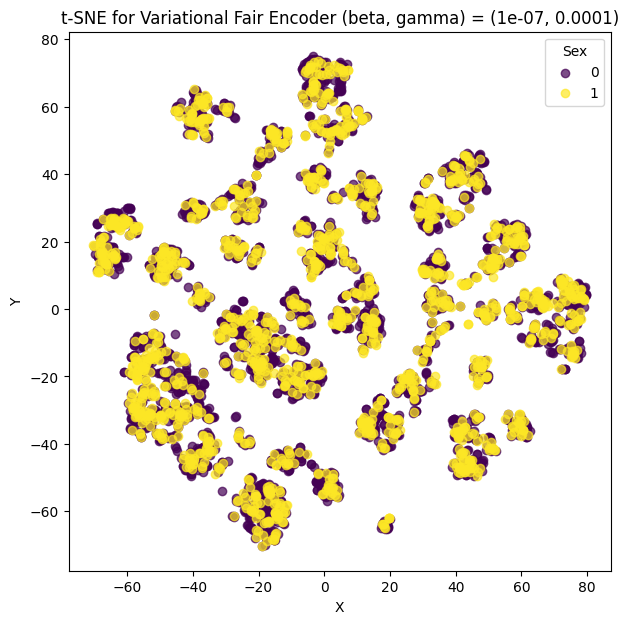

In [ ]:
ys = {'y_train' : y_train_adult_np, 'y_test': y_test_adult_np}
for process_name, data_dict in adult_xs.items():
    tsne_cluster_plot(process_name, data_dict, ys, 'Sex')

In [ ]:


def tsne_cluster_plot(process, xs, ys, sens_label, sample_size=5000):
    # x_train_with_y = np.hstack((xs['x_train']))
    # x_test_with_y = np.hstack((xs['x_test']))
    Y = np.vstack((ys['y_train'], ys['y_test']))

    X = np.vstack((xs['x_train'], xs['x_test']))
    sens = list(xs['sens_train']) + list(xs['sens_test'])

    sample_size = min(sample_size, len(X))

    # Perform t-SNE on the combined data
    X_tsne = TSNE(n_components=2, random_state=0).fit_transform(X[:sample_size])
    sens_subset = sens[:sample_size]
    Y_subset = Y[:sample_size]

    # --- Plot 1: t-SNE with sensitive attribute as the legend ---
    unique_attrs = np.unique(sens_subset)
    colors = cm.viridis(np.linspace(0, 1, len(unique_attrs)))
    color_map = dict(zip(unique_attrs, colors))

    plt.figure(figsize=(7, 7))
    for attr in unique_attrs:
        indices = [i for i, s in enumerate(sens_subset) if s == attr]
        plt.scatter(
            X_tsne[indices, 0],
            X_tsne[indices, 1],
            label=f'{attr}',
            color=color_map[attr],
            alpha=0.7
        )

    plt.title(f't-SNE for {process} with {sens_label} as the legend')
    plt.xlabel('X')
    plt.ylabel('Y')
    plt.legend(title=sens_label)
    plt.show()

    # --- Plot 2: t-SNE with target variable (Y) as the legend ---
    unique_y = np.unique(Y_subset)
    colors = cm.viridis(np.linspace(0, 1, len(unique_y)))
    color_map = dict(zip(unique_y, colors))

    plt.figure(figsize=(7, 7))
    for label in unique_y:
        indices = [i for i, y in enumerate(Y_subset) if y == label]
        plt.scatter(
            X_tsne[indices, 0],
            X_tsne[indices, 1],
            label=f'Y={label}',
            color=color_map[label],
            alpha=0.7
        )

    plt.title(f't-SNE for {process} with Y as the legend')
    plt.xlabel('X')
    plt.ylabel('Y')
    plt.legend(title='Target variable (Y)')
    plt.show()

    # --- Plot 3: t-SNE with combination of Y and sensitive attribute as the legend ---
    unique_comb = [(y, s) for y in unique_y for s in unique_attrs]
    colors = cm.viridis(np.linspace(0, 1, len(unique_comb)))
    color_map = dict(zip(unique_comb, colors))

    plt.figure(figsize=(7, 7))
    for comb in unique_comb:
        indices = [i for i, (y, s) in enumerate(zip(Y_subset, sens_subset)) if (y, s) == comb]
        plt.scatter(
            X_tsne[indices, 0],
            X_tsne[indices, 1],
            label=f'Y={comb[0]}, {sens_label}={comb[1]}',
            color=color_map[comb],
            alpha=0.7
        )

    plt.title(f't-SNE for {process} with Y and {sens_label} as the legend')
    plt.xlabel('X')
    plt.ylabel('Y')
    plt.legend(title=f'Combination of Target and {sens_label}')
    plt.show()



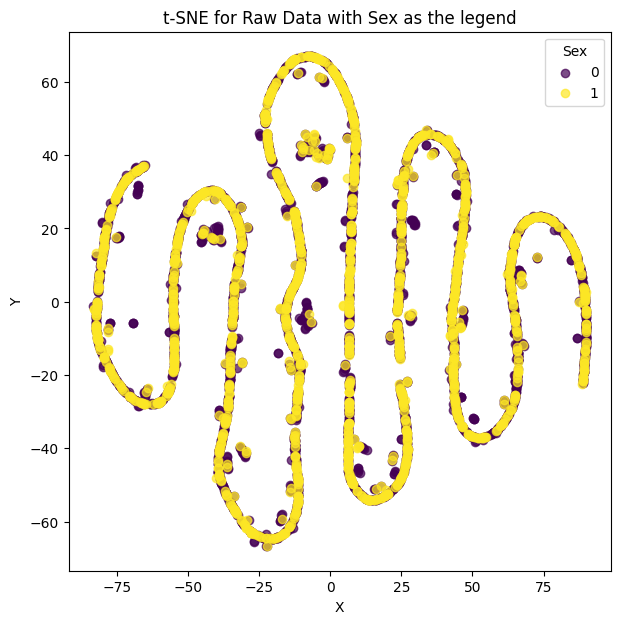

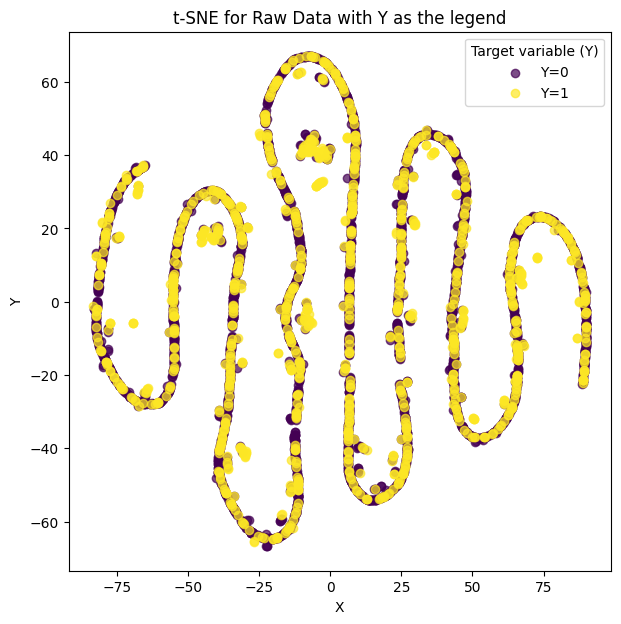

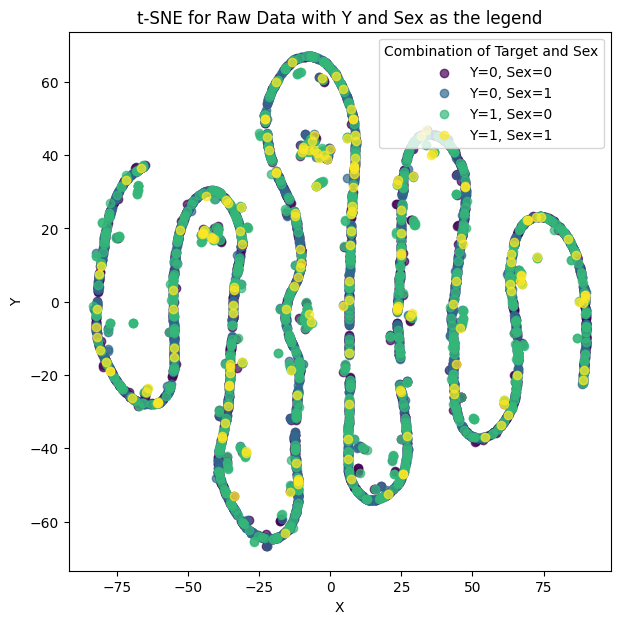

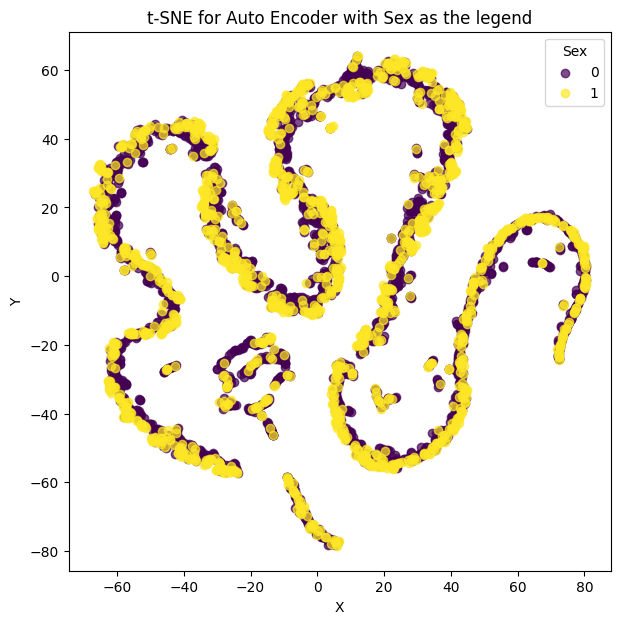

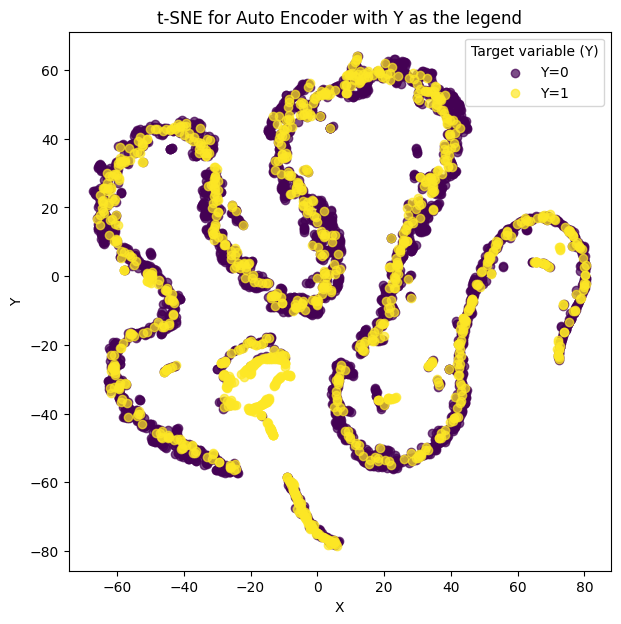

...

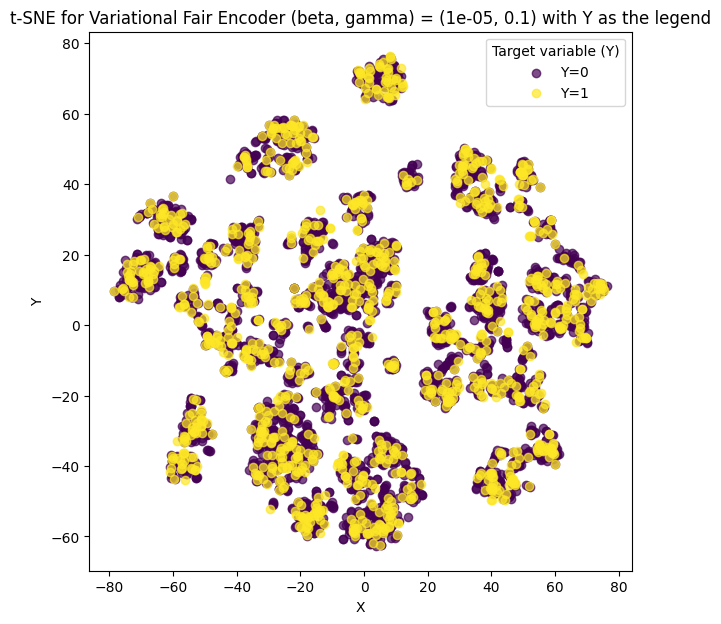

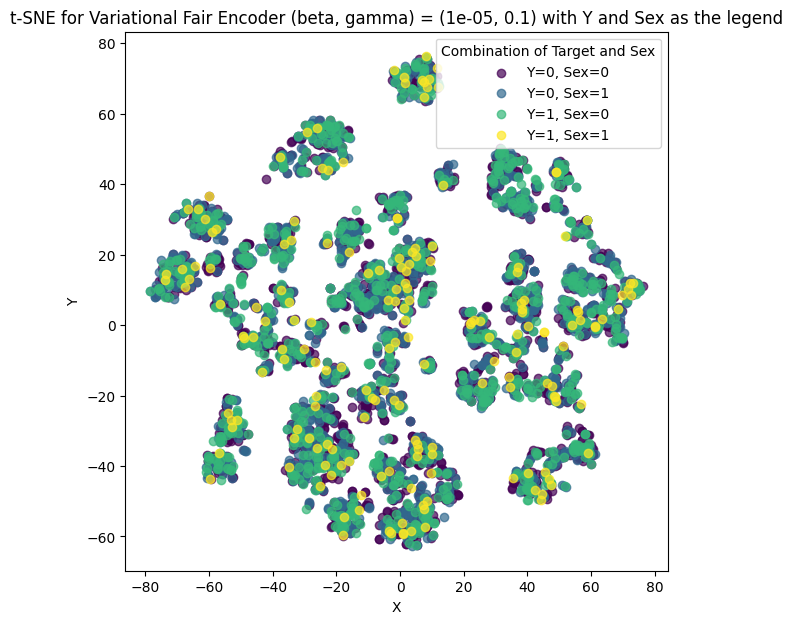

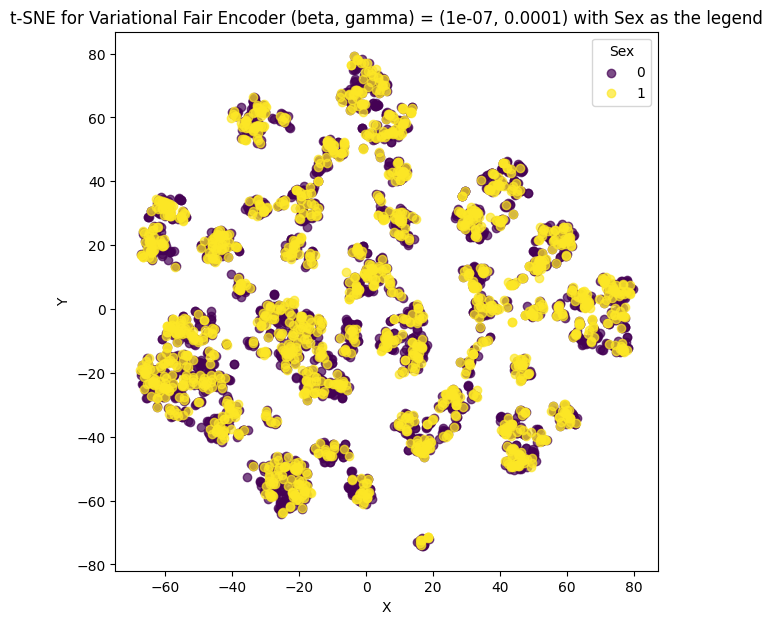

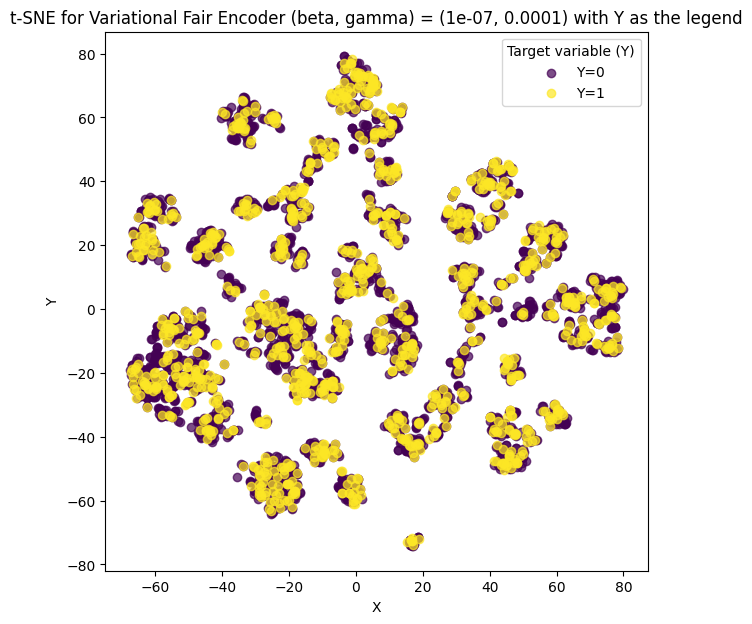

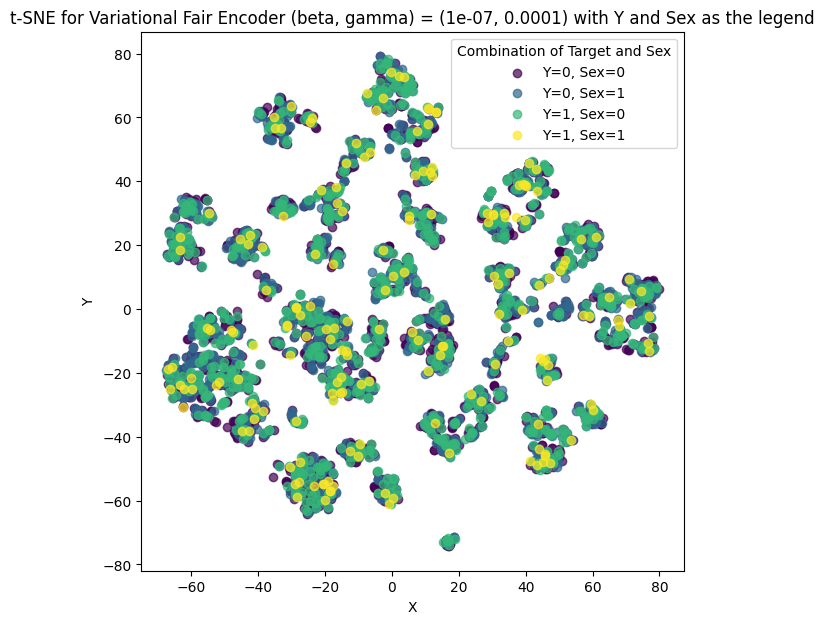

In [ ]:
ys = {'y_train' : y_train_adult_np, 'y_test': y_test_adult_np}
for process_name, data_dict in adult_xs.items():
    tsne_cluster_plot(process_name, data_dict, ys, 'Sex')

## German Clustering


In [ ]:
vae_b = [0.1, 0.001, 0.00001, 0.0000001]
vae_g = [0.0000001, 0.00001, 0.1, 0.0001]
vae_xs_german = {}

for i, beta in enumerate(vae_b):
    gamma = vae_g[i]
    # Train the VAE model with the current beta and gamma
    # (Add training loop here as per your model setup)
    input_dim = X_train_ger_np.shape[1]
    latent_dim = 14
    sensitive_dim = 0  # Index of the sensitive dimension in Z
    output_dim = X_train_ger_np.shape[1]
    batch_size = 32
    num_epochs = 10
    learning_rate = 1e-3

    # Initialize model, optimizer, and dataloader
    model = VIBAutoencoder(input_dim, latent_dim, output_dim, sensitive_dim)
    optimizer = optim.Adam(model.parameters(), lr=learning_rate)
    train_loader = DataLoader(TensorDataset(X_train_ger_tensor_norm), batch_size=batch_size, shuffle=True)

    # Training loop
    for epoch in range(num_epochs):
        model.train()
        total_loss = 0
        for batch in train_loader:
            x_batch = batch[0]

            # Forward pass
            recon_x, mu, logvar, z = model(x_batch)

            # Compute loss with selective KL-divergence for a single sensitive dimension
            loss = modified_vib_loss(recon_x, x_batch, mu, logvar, sensitive_dim, beta=0.01)

            # Backward and optimize
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            total_loss += loss.item()

        # Logging
        avg_loss = total_loss / len(train_loader.dataset)

    print(f"Training completed for gamma: {gamma}, beta: {beta}")

    # After training, generate embeddings with the VAE for both training and test sets
    X_train_german_embs = generate_embeddings(model, train_loader)
    test_loader = DataLoader(TensorDataset(X_test_ger_tensor_norm), batch_size=batch_size, shuffle=True)
    X_test_german_embs = generate_embeddings(model, test_loader)

    X_train_german_embs = X_train_german_embs.detach().numpy()
    vae_xs_german[f'Variational Fair Encoder (beta, gamma) = ({beta}, {gamma})'] = {'x_train' : X_train_german_embs, 'x_test' : X_test_german_embs, "sens_train": sensitive_train_ger_np, "sens_test" : sensitive_test_ger_np}

Training completed for gamma: 1e-07, beta: 0.1
Training completed for gamma: 1e-05, beta: 0.001
Training completed for gamma: 0.1, beta: 1e-05
Training completed for gamma: 0.0001, beta: 1e-07


In [ ]:
german_xs = {
    'Raw Data' : {'x_train' : X_train_ger_np, 'x_test' : X_test_ger_np, "sens_train": sensitive_train_ger_np, "sens_test" : sensitive_test_ger_np},
    'Auto Encoder' : {'x_train' : X_train_encoded_german, 'x_test' : X_test_encoded_german, "sens_train": sensitive_train_ger_np, "sens_test" : sensitive_test_ger_np},
    # 'Fair Encoder' : {'x_train' : fair_embedded_train_ger_np, 'x_test' : fair_embedding_test_ger_np, "sens_train": sensitive_train_ger_np, "sens_test" : sensitive_test_ger_np},
    **vae_xs_german
}

# X_train_ger_np, X_test_ger_np, y_train_ger_np, y_test_ger_np, sensitive_train_ger_np, sensitive_test_ger_np

Raw Data


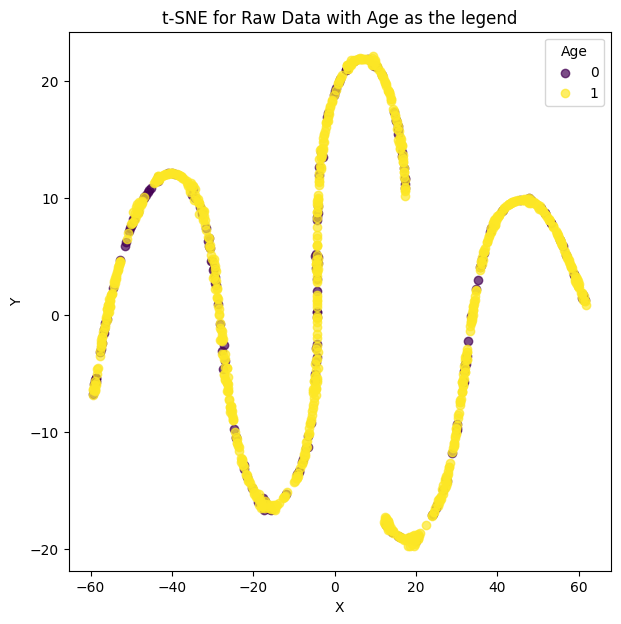

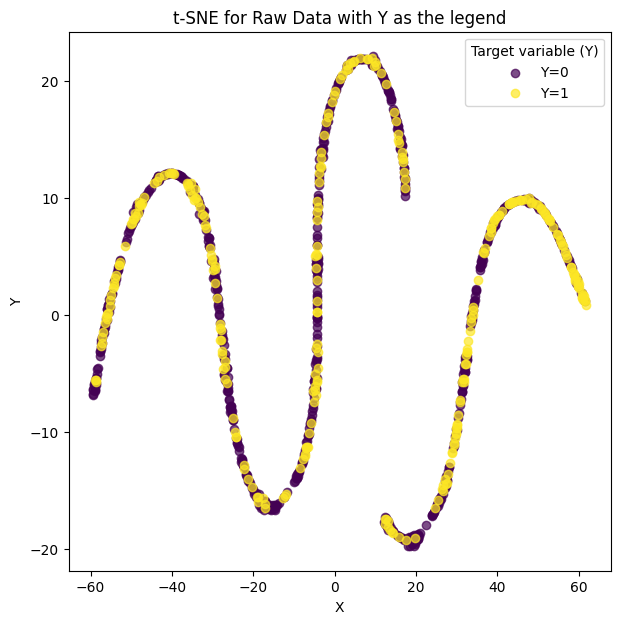

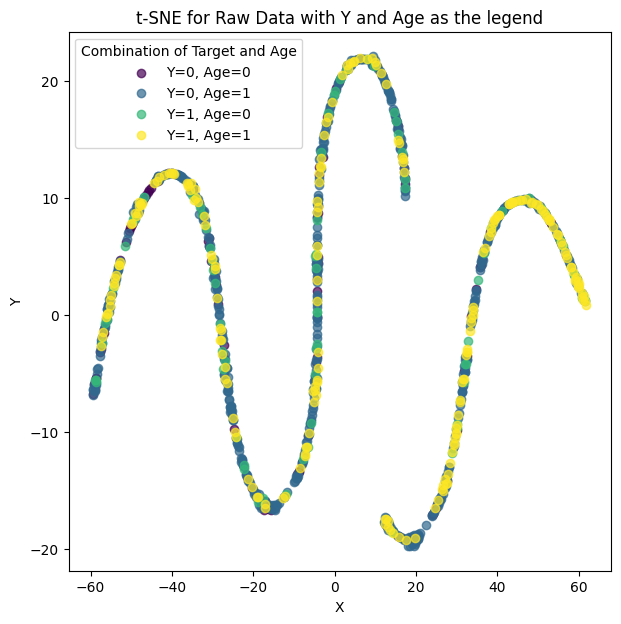

Auto Encoder


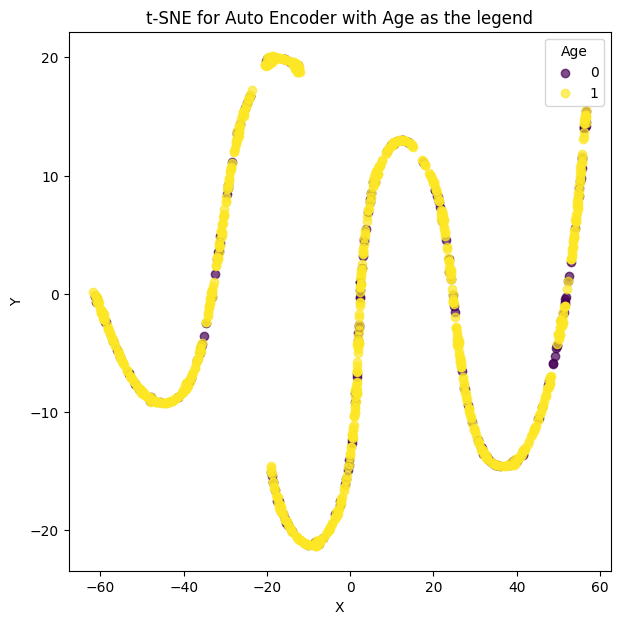

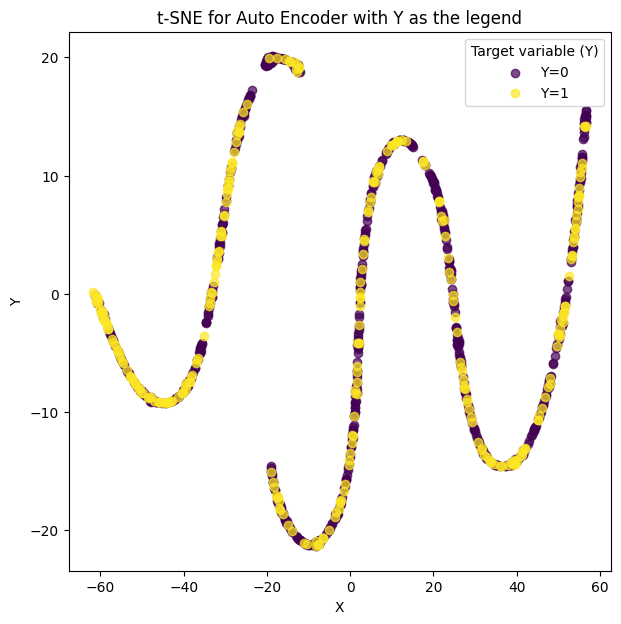

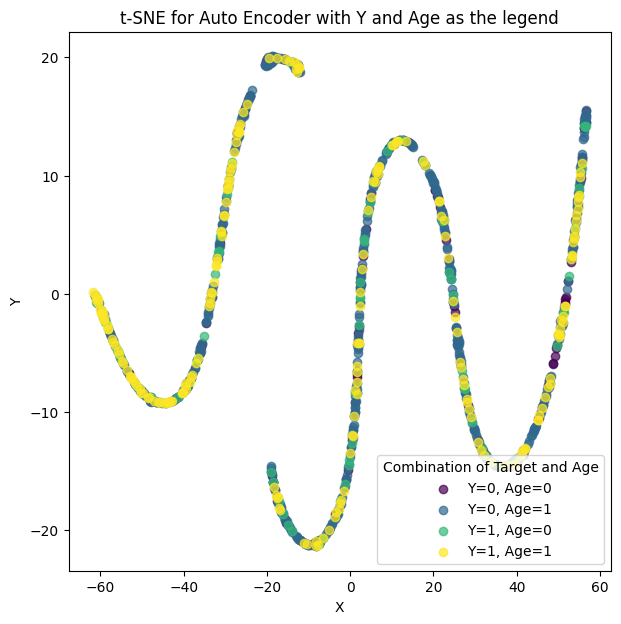

Variational Fair Encoder (beta, gamma) = (0.1, 1e-07)


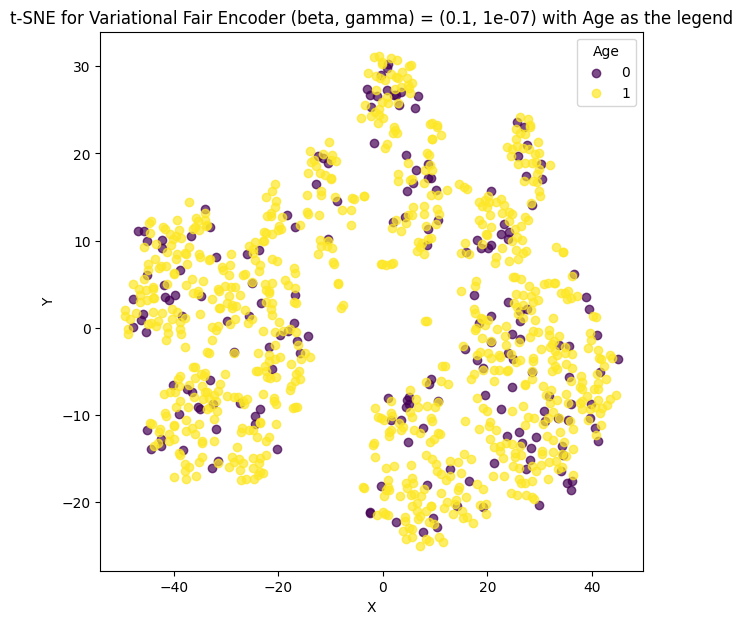

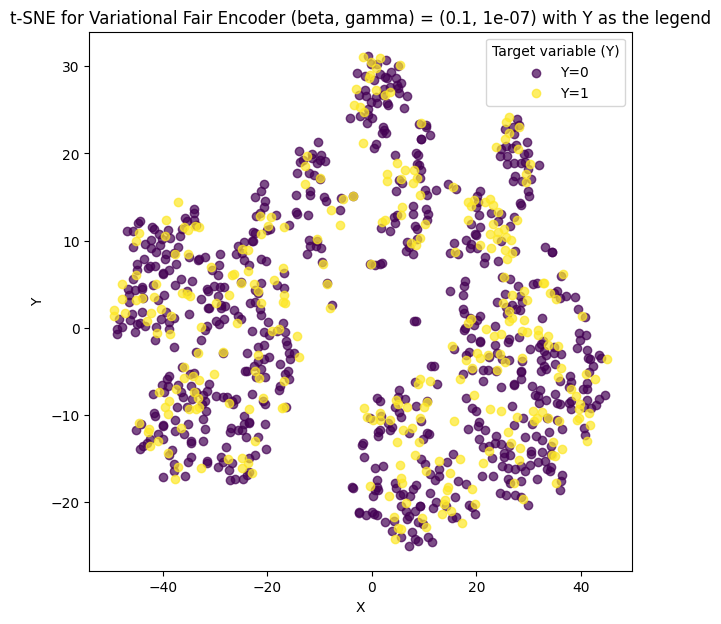

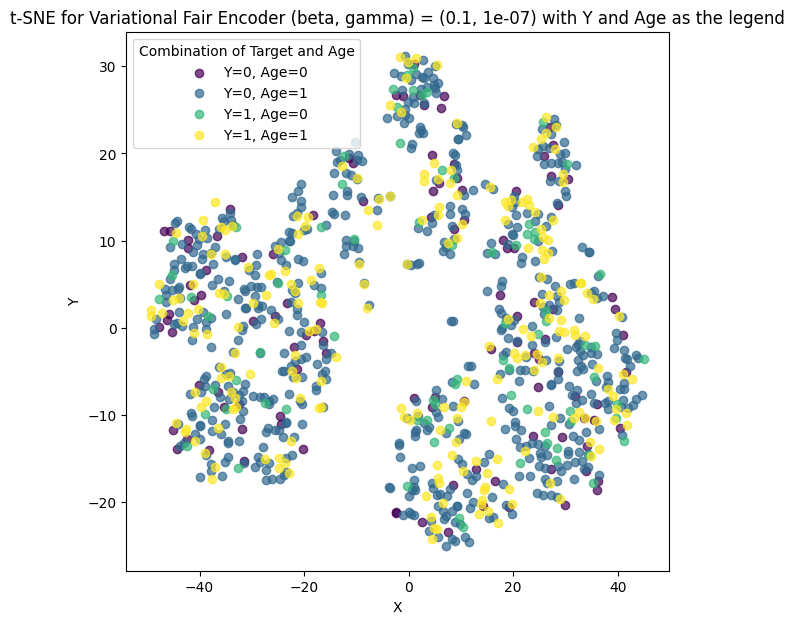

Variational Fair Encoder (beta, gamma) = (0.001, 1e-05)


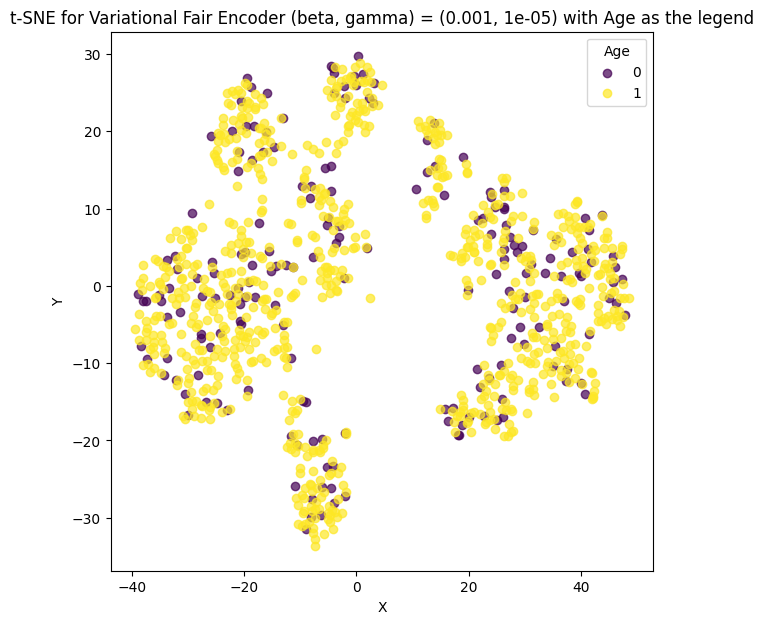

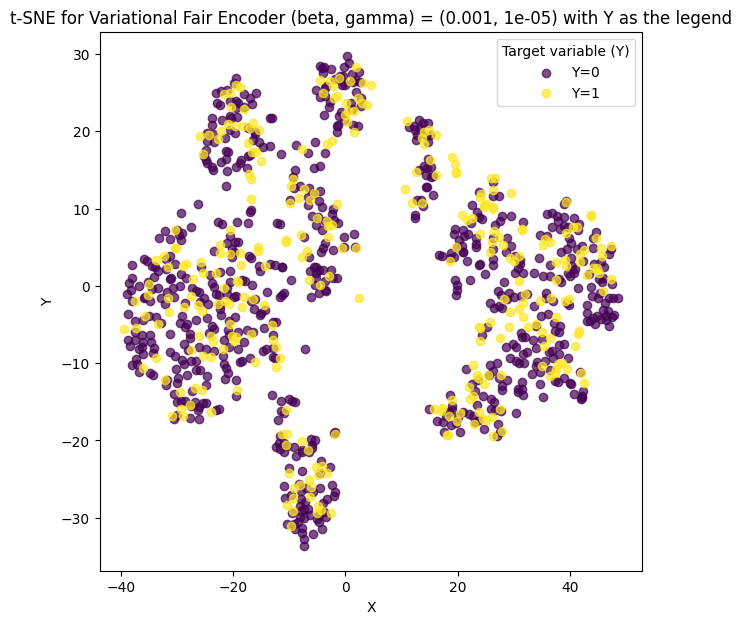

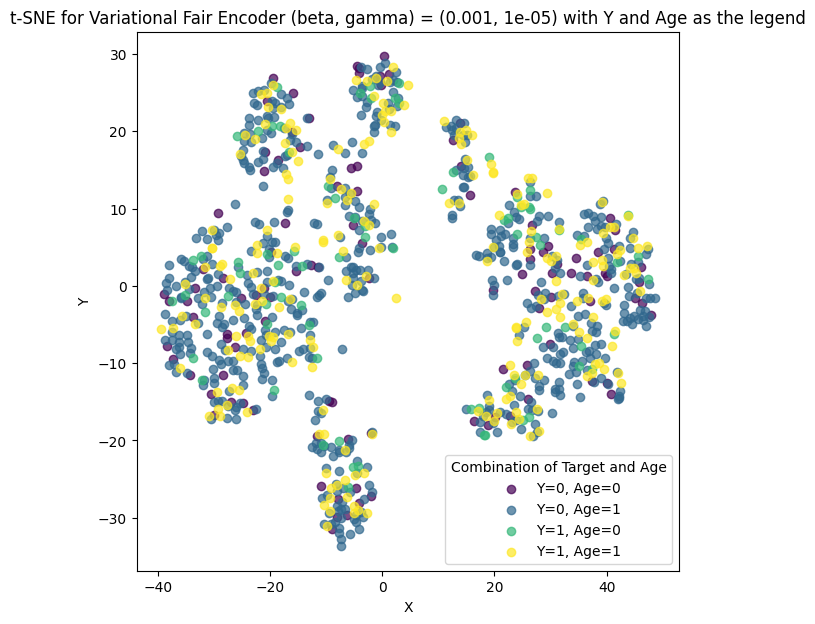

Variational Fair Encoder (beta, gamma) = (1e-05, 0.1)


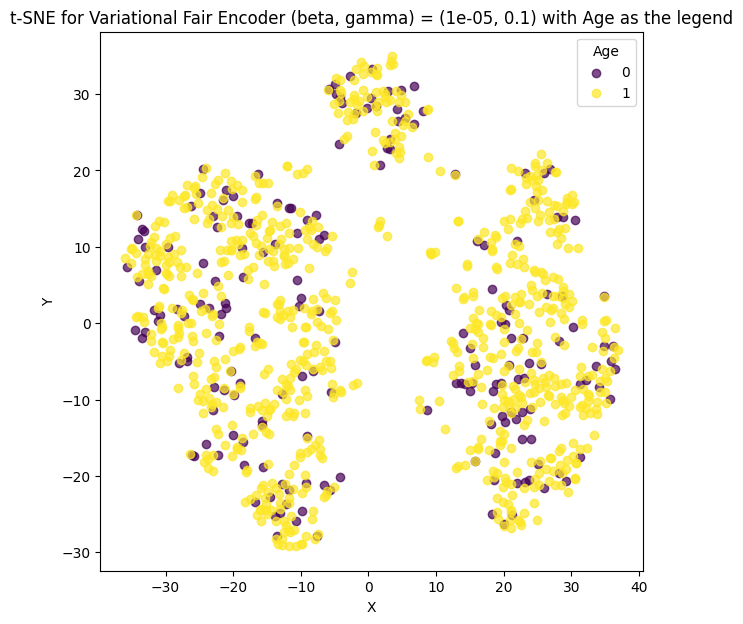

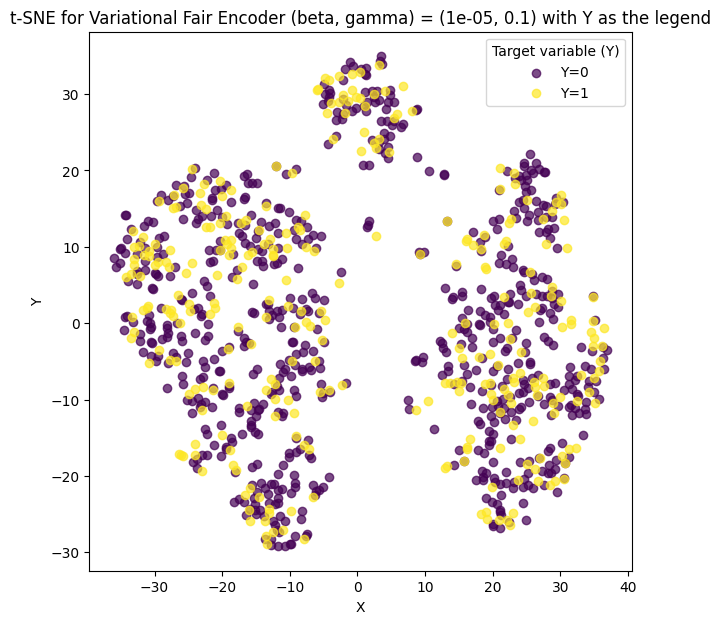

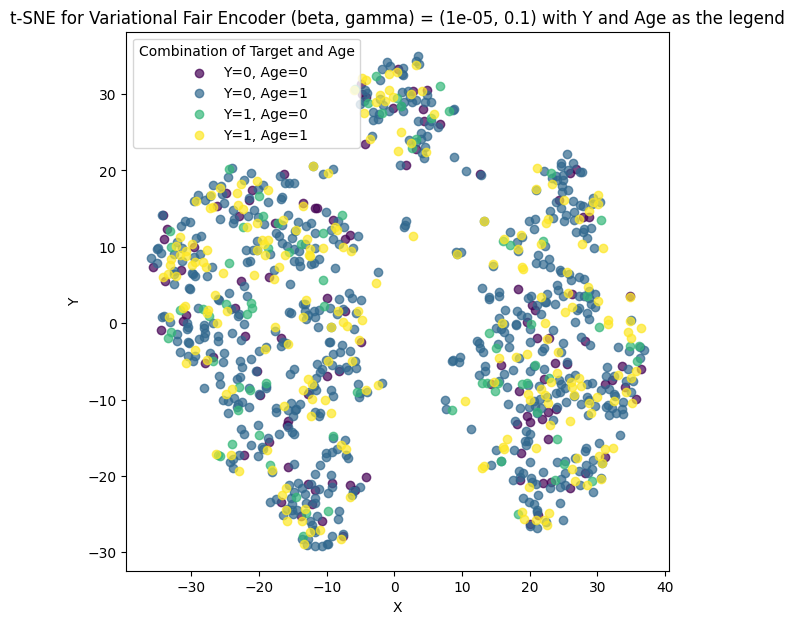

Variational Fair Encoder (beta, gamma) = (1e-07, 0.0001)


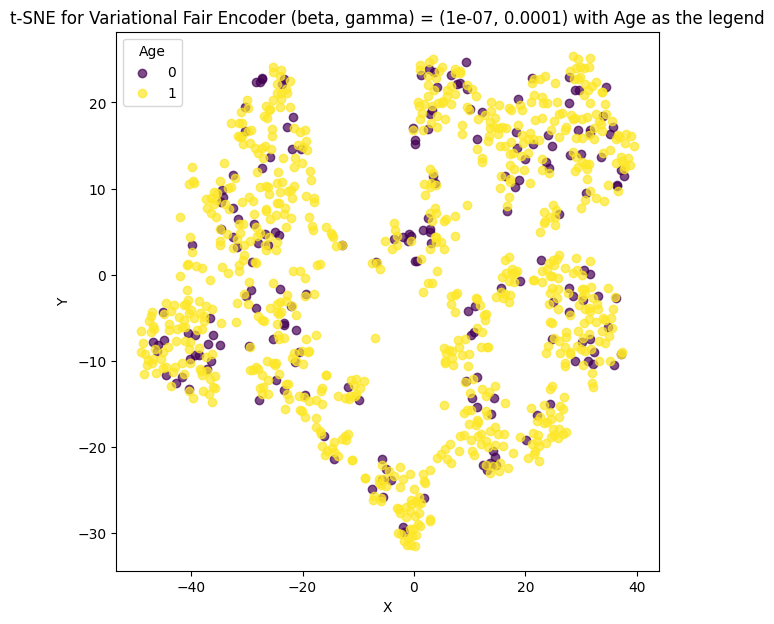

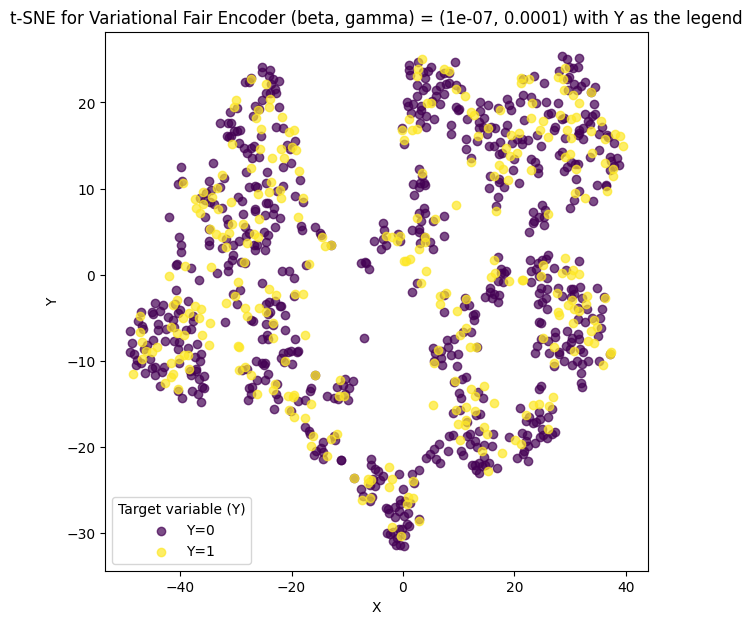

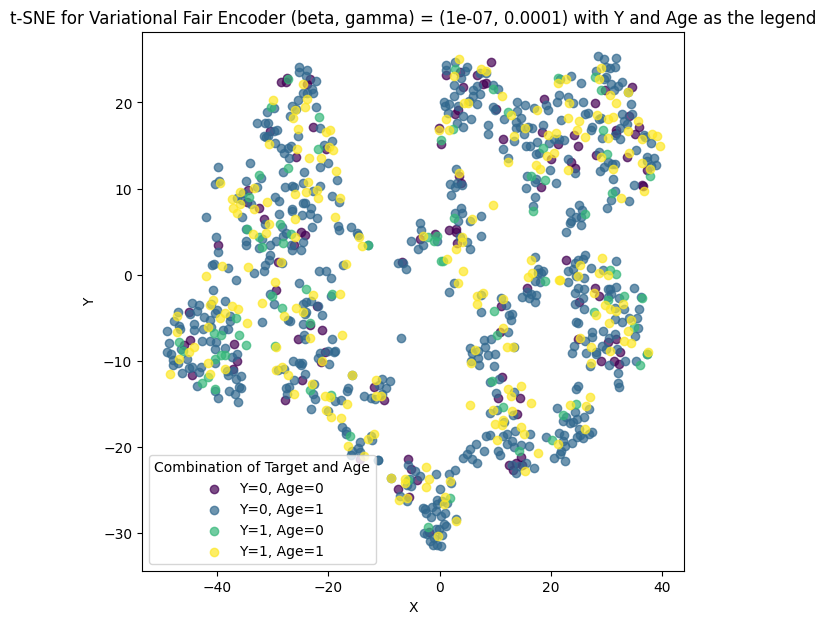

In [ ]:
ys = {'y_train' : y_train_ger_np, 'y_test': y_test_ger_np}
for process_name, data_dict in german_xs.items():
    print(process_name)
    tsne_cluster_plot(process_name, data_dict, ys, 'Age')

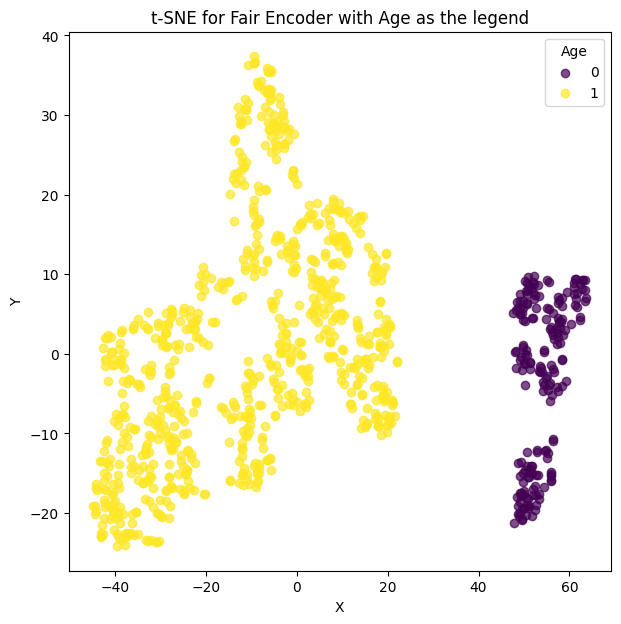

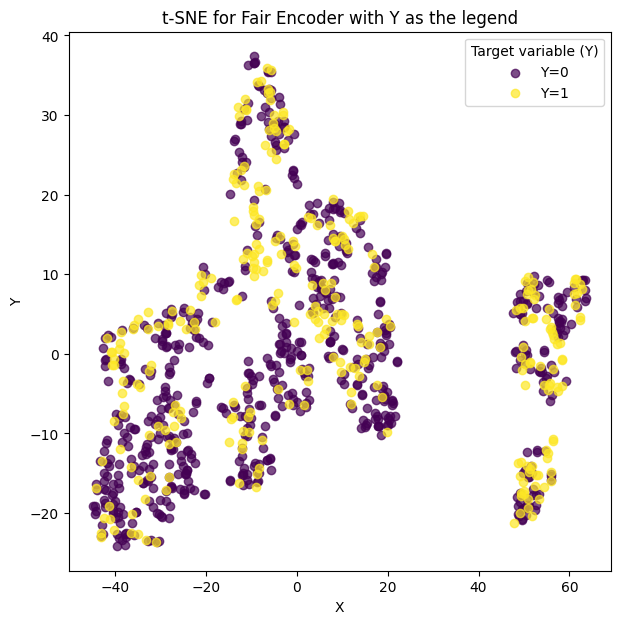

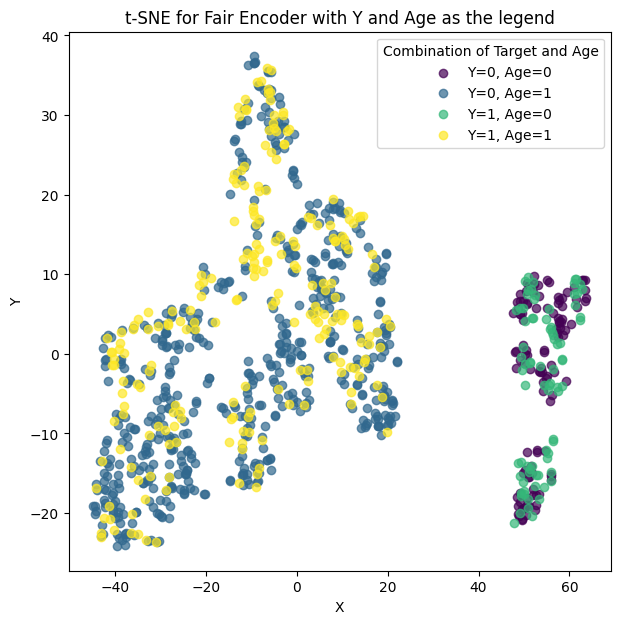

In [ ]:
fair_encoder =  {'x_train' : fair_embedded_train_ger_np, 'x_test' : fair_embedding_test_ger_np, "sens_train": sensitive_train_ger_np, "sens_test" : sensitive_test_ger_np}
ys = {'y_train' : y_train_ger_np, 'y_test': y_test_ger_np}
process = 'Fair Encoder'
sens_label = 'Age'

Y = np.vstack((ys['y_train'], ys['y_test']))

X = np.vstack((fair_encoder['x_train'], fair_encoder['x_test']))
X = X.astype('float16')
sens = list(fair_encoder['sens_train']) + list(fair_encoder['sens_test'])

sample_size = min(5000, len(X))

# Perform t-SNE on the combined data
X_tsne = TSNE(n_components=2, random_state=0).fit_transform(X[:sample_size])
sens_subset = sens[:sample_size]
Y_subset = Y[:sample_size]

# --- Plot 1: t-SNE with sensitive attribute as the legend ---
unique_attrs = np.unique(sens_subset)
colors = cm.viridis(np.linspace(0, 1, len(unique_attrs)))
color_map = dict(zip(unique_attrs, colors))

plt.figure(figsize=(7, 7))
for attr in unique_attrs:
    indices = [i for i, s in enumerate(sens_subset) if s == attr]
    plt.scatter(
        X_tsne[indices, 0],
        X_tsne[indices, 1],
        label=f'{attr}',
        color=color_map[attr],
        alpha=0.7
    )

plt.title(f't-SNE for {process} with {sens_label} as the legend')
plt.xlabel('X')
plt.ylabel('Y')
plt.legend(title=sens_label)
plt.show()

# --- Plot 2: t-SNE with target variable (Y) as the legend ---
unique_y = np.unique(Y_subset)
colors = cm.viridis(np.linspace(0, 1, len(unique_y)))
color_map = dict(zip(unique_y, colors))

plt.figure(figsize=(7, 7))
for label in unique_y:
    indices = [i for i, y in enumerate(Y_subset) if y == label]
    plt.scatter(
        X_tsne[indices, 0],
        X_tsne[indices, 1],
        label=f'Y={label}',
        color=color_map[label],
        alpha=0.7
    )

plt.title(f't-SNE for {process} with Y as the legend')
plt.xlabel('X')
plt.ylabel('Y')
plt.legend(title='Target variable (Y)')
plt.show()

# --- Plot 3: t-SNE with combination of Y and sensitive attribute as the legend ---
unique_comb = [(y, s) for y in unique_y for s in unique_attrs]
colors = cm.viridis(np.linspace(0, 1, len(unique_comb)))
color_map = dict(zip(unique_comb, colors))

plt.figure(figsize=(7, 7))
for comb in unique_comb:
    indices = [i for i, (y, s) in enumerate(zip(Y_subset, sens_subset)) if (y, s) == comb]
    plt.scatter(
        X_tsne[indices, 0],
        X_tsne[indices, 1],
        label=f'Y={comb[0]}, {sens_label}={comb[1]}',
        color=color_map[comb],
        alpha=0.7
    )

plt.title(f't-SNE for {process} with Y and {sens_label} as the legend')
plt.xlabel('X')
plt.ylabel('Y')
plt.legend(title=f'Combination of Target and {sens_label}')
plt.show()



In [ ]:
fair_embedding_test_ger_np[1]

array([0.06095205, 0.04348877, 0.0438349 , 0.04748691, 0.04636332,
       0.04650694, 0.04293569, 0.04553291, 0.04314197, 0.06072151,
       0.04395493, 0.04843305, 0.05046836, 0.04568428, 0.05548326,
       0.04497335, 0.08224633, 0.04481163, 0.0561236 , 0.04685626],
      dtype=float32)

## With Y

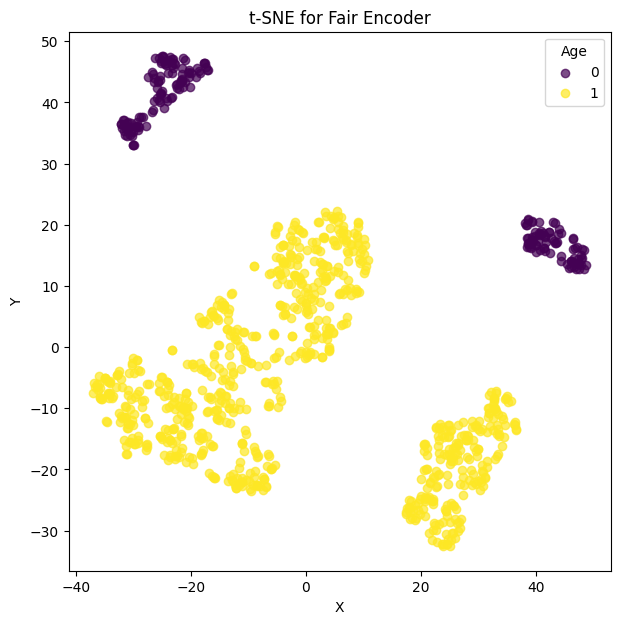

In [ ]:
fair_encoder =  {'x_train' : fair_embedded_train_ger_np, 'x_test' : fair_embedding_test_ger_np, "sens_train": sensitive_train_ger_np, "sens_test" : sensitive_test_ger_np}
ys = {'y_train' : y_train_ger_np, 'y_test': y_test_ger_np}
process = 'Fair Encoder'
sens_label = 'Age'

x_train_with_y = np.hstack((fair_encoder['x_train'], ys['y_train']))
x_test_with_y = np.hstack((fair_encoder['x_test'], ys['y_test']))

X = np.vstack((x_train_with_y, x_test_with_y))
sens = list(fair_encoder['sens_train']) + list(fair_encoder['sens_test'])

sample_size = min(sample_size, len(X))

X_tsne = TSNE(n_components=2, random_state=0).fit_transform(X[:sample_size])
sens_subset = sens[:sample_size]

unique_attrs = np.unique(sens_subset)
colors = cm.viridis(np.linspace(0, 1, len(unique_attrs)))
color_map = dict(zip(unique_attrs, colors))

plt.figure(figsize=(7, 7))
for attr in unique_attrs:
    indices = [i for i, s in enumerate(sens_subset) if s == attr]
    plt.scatter(
        X_tsne[indices, 0],
        X_tsne[indices, 1],
        label=f'{attr}',
        color=color_map[attr],
        alpha=0.7
    )

plt.title(f't-SNE for {process}')
plt.xlabel('X')
plt.ylabel('Y')
plt.legend(title=sens_label)
plt.show()